<a href="https://colab.research.google.com/github/Covpet/ENHANCING-PLANT-DISEASE-DETECTION-WITH-DEEP-LEARNING-MODELS/blob/main/plant_disease_detection_(cassava_and_maize)_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install keras-tuner --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.5 MB/s eta 0:00:00


### Import Important libraries from the python package

In [2]:
import os
import cv2

import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import shutil
import tensorflow as tf
from PIL import ImageFile
import keras_tuner as kt
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D , Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import metrics
from tensorflow.keras.applications import MobileNetV2, ResNet50, VGG16
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import ResNet50

# Mount Google drive

In [3]:
# Import and mount Google Drive.
from google.colab import drive

drive.mount("/content/drive")


Mounted at /content/drive


# DATA PREPROCESSING

# Base directory structure for maize, Clean up was done for maize due to corrupted images

Displaying images from folder: fall armyworm


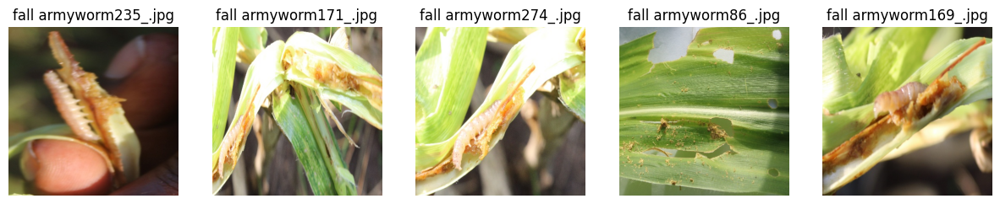

Displaying images from folder: grasshoper


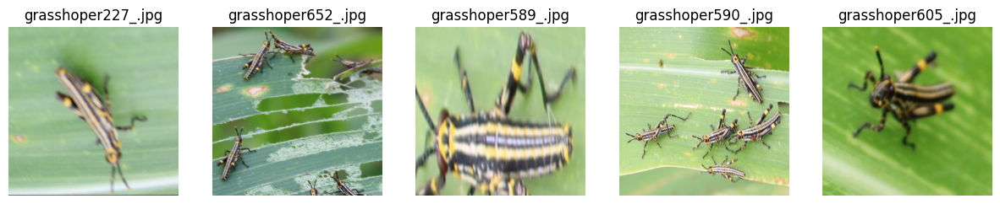

Displaying images from folder: healthy


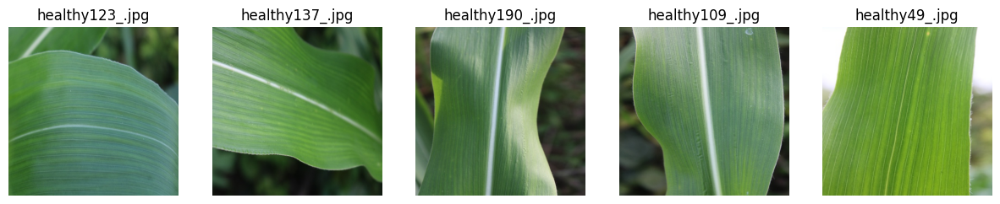

Displaying images from folder: leaf beetle


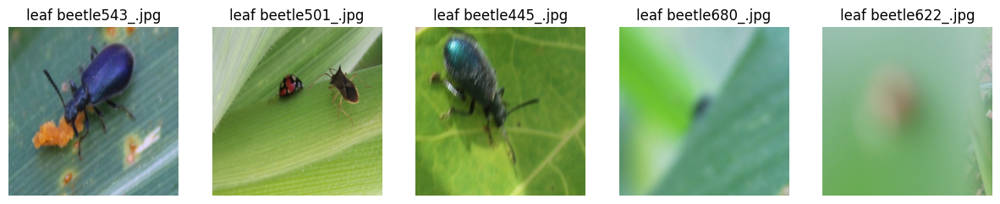

Displaying images from folder: leaf blight


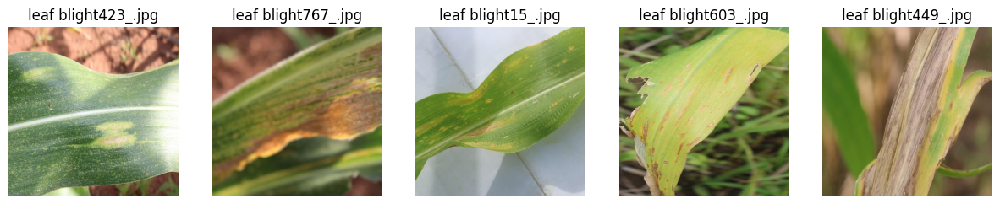

Displaying images from folder: leaf spot


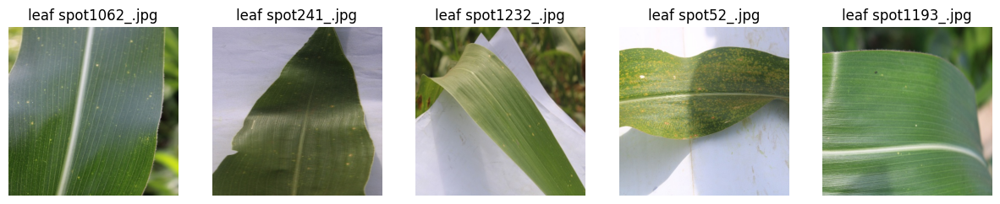

Displaying images from folder: streak virus


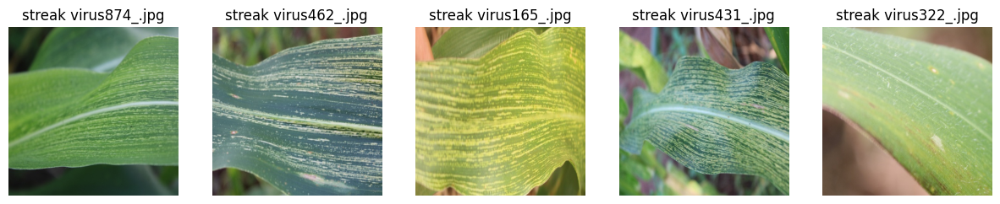

In [4]:
# Define base directory and folder names
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Function to display a sample of 5 images from each folder
def display_images_from_folders(base_dir, folders, num_images=5):
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        print(f"Displaying images from folder: {folder}")

        # Remove invalid images before displaying
        remove_invalid_images(folder_path)

        # Get all valid image files in the folder after cleanup
        files = [f for f in os.listdir(folder_path) if is_valid_image(os.path.join(folder_path, f))]

        if len(files) < num_images:
            print(f"Not enough valid images in {folder}. Found only {len(files)} valid images.")
            continue

        # Randomly select images to display
        selected_files = random.sample(files, num_images)

        # Create a subplot to display images
        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

        for i, file in enumerate(selected_files):
            img_path = os.path.join(folder_path, file)
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(file)

        plt.show()

# Call the function to display images and remove invalid ones
display_images_from_folders(base_dir, folders)

#  Directory structure for cassava


                                          image_path             class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight


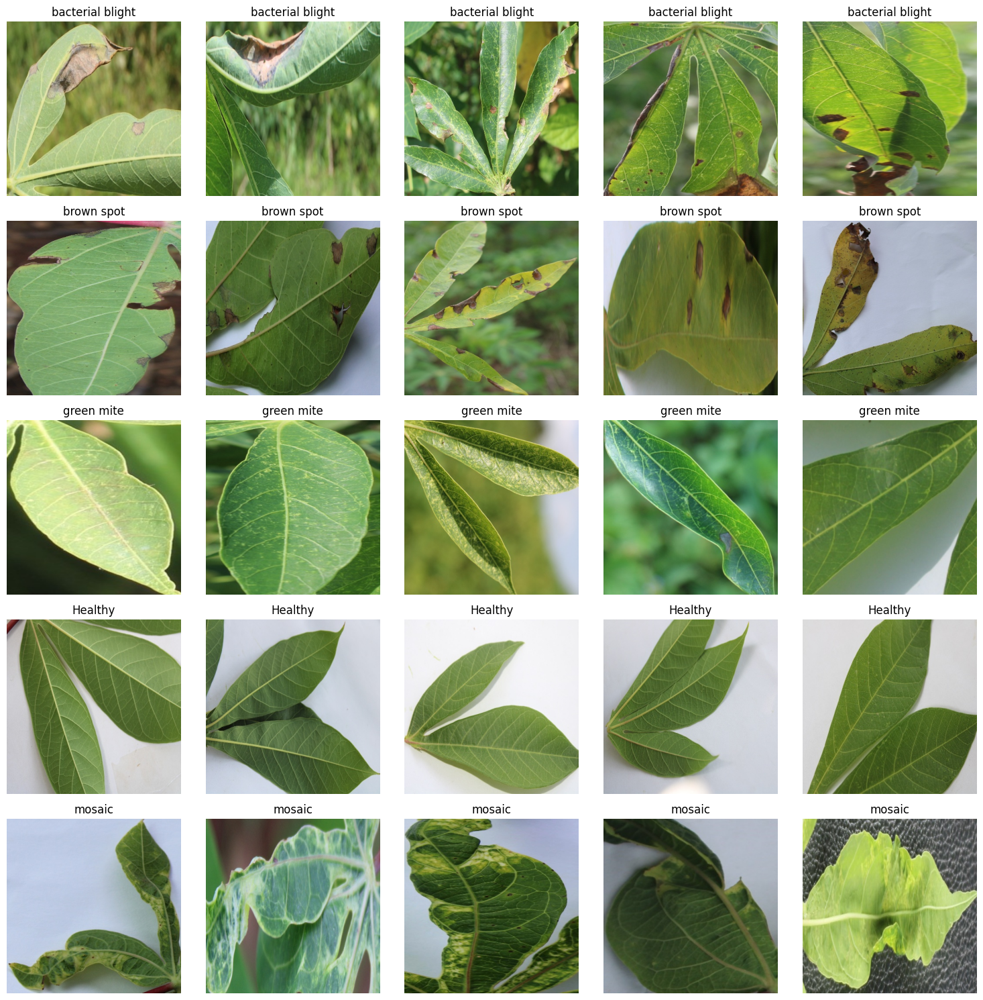

In [5]:
# Directory structure
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# List to store image paths and their corresponding classes
image_paths = []
image_classes = []

# Iterate through each folder and collect image paths
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(folder)

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'] == folder].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

# Maize and Cassava info counts

In [6]:
# Function to load and prepare the DataFrame
def load_data(base_dir, folders):
    image_paths = []
    image_classes = []

    # Iterate through each folder and collect image paths
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        for filename in os.listdir(folder_path):
            if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
                image_paths.append(os.path.join(folder_path, filename))
                image_classes.append(folder)

    # Create a DataFrame
    df_images = pd.DataFrame({
        'image_path': image_paths,
        'class': image_classes
    })

    return df_images

# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# Count the number of images per class
maize_class_counts = df_maize['class'].value_counts()
cassava_class_counts = df_cassava['class'].value_counts()

# Count the file formats for both datasets
maize_file_formats = df_maize['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
cassava_file_formats = df_cassava['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()

# Display counts for Maize
print("Maize Class Counts:")
print(maize_class_counts)
print("\nMaize File Format Counts:")
print(maize_file_formats)

# Display counts for Cassava
print("\nCassava Class Counts:")
print(cassava_class_counts)
print("\nCassava File Format Counts:")
print(cassava_file_formats)

Maize Class Counts:
class
leaf spot        1249
streak virus     1002
leaf blight       998
leaf beetle       938
grasshoper        683
fall armyworm     285
healthy           206
Name: count, dtype: int64

Maize File Format Counts:
image_path
jpg    5361
Name: count, dtype: int64

Cassava Class Counts:
class
bacterial blight    2772
brown spot          1506
Healthy             1283
mosaic              1235
green mite          1154
Name: count, dtype: int64

Cassava File Format Counts:
image_path
jpg    7950
Name: count, dtype: int64


# Exploratory data Analysis for maize and cassava

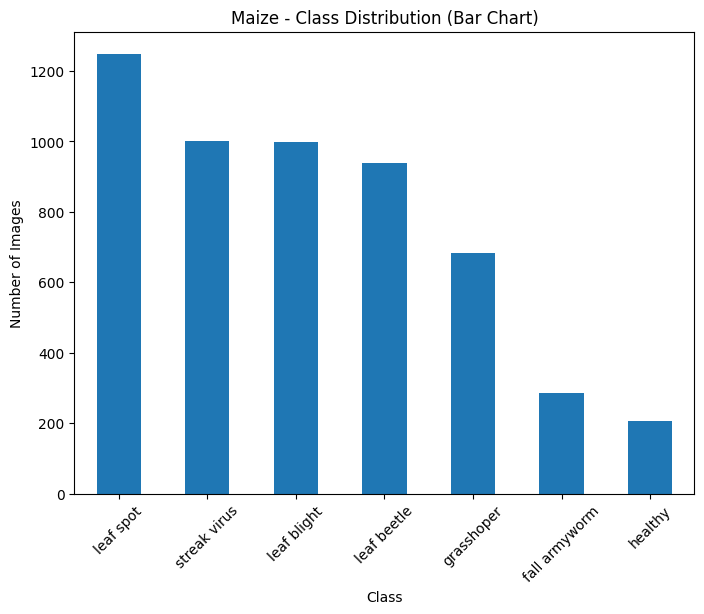

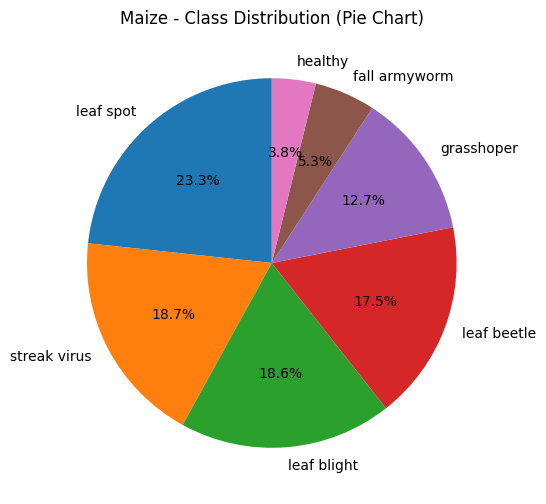

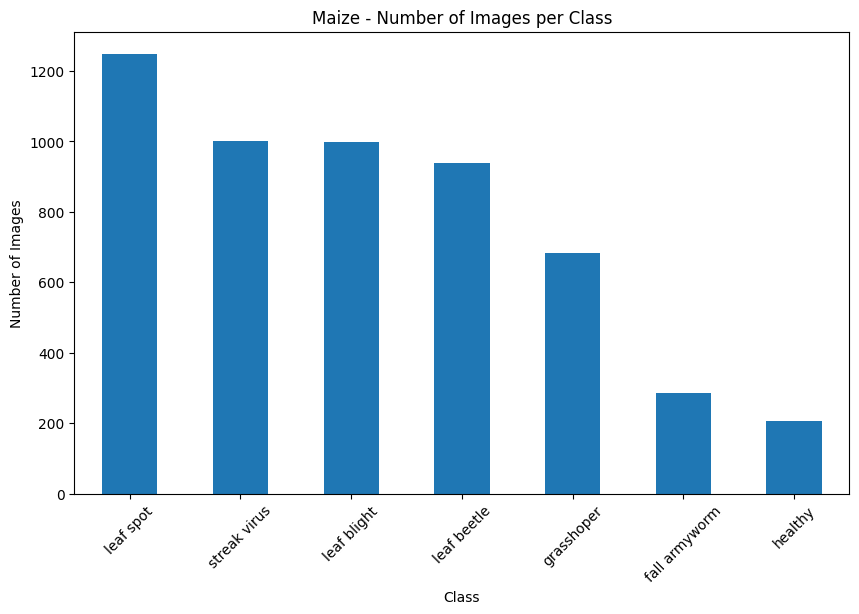

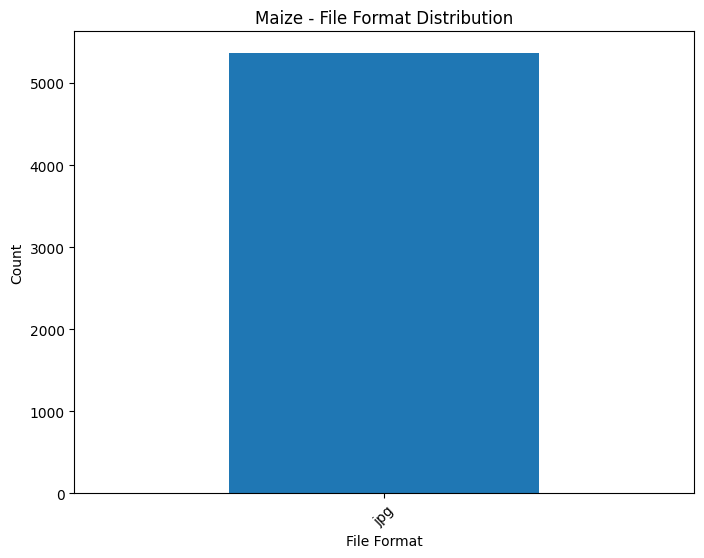

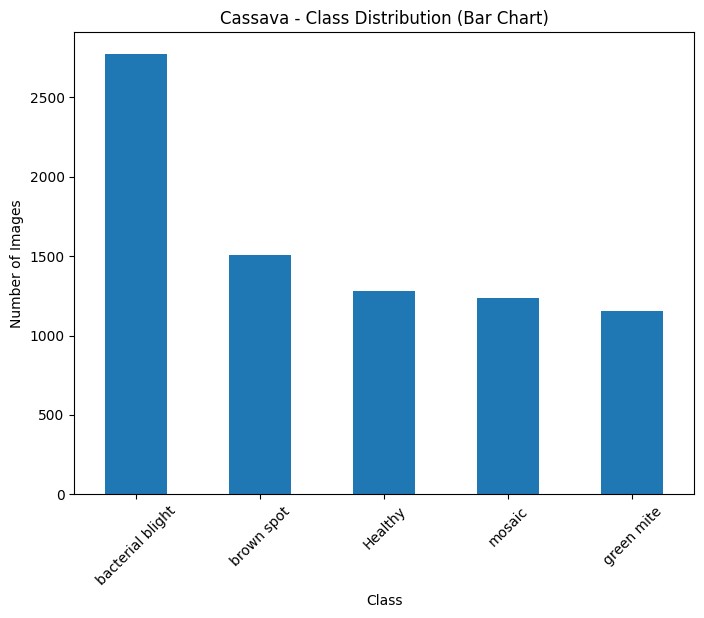

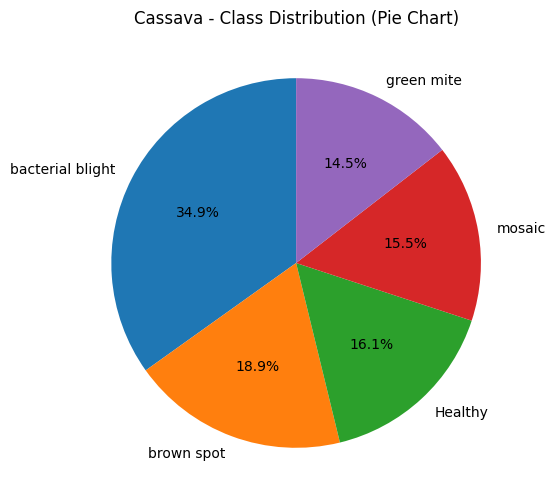

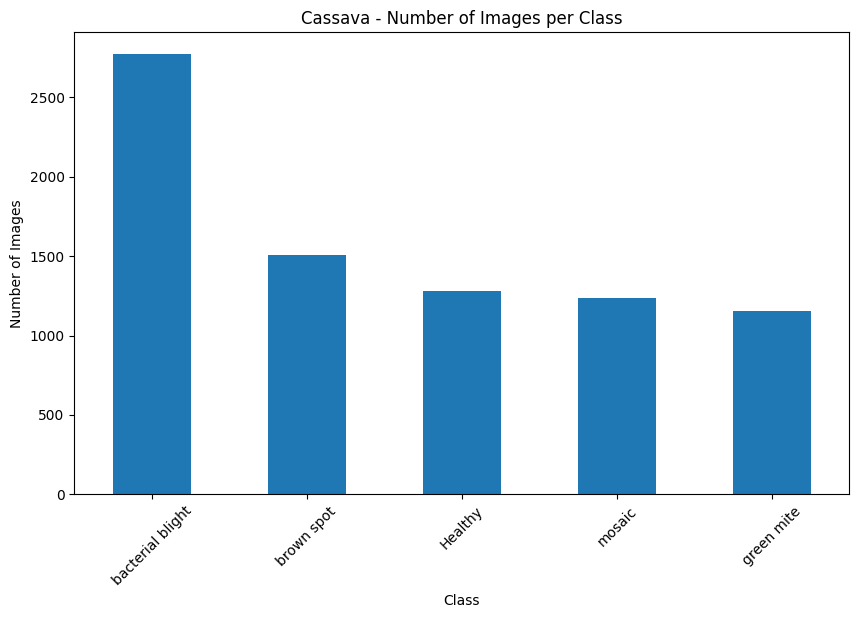

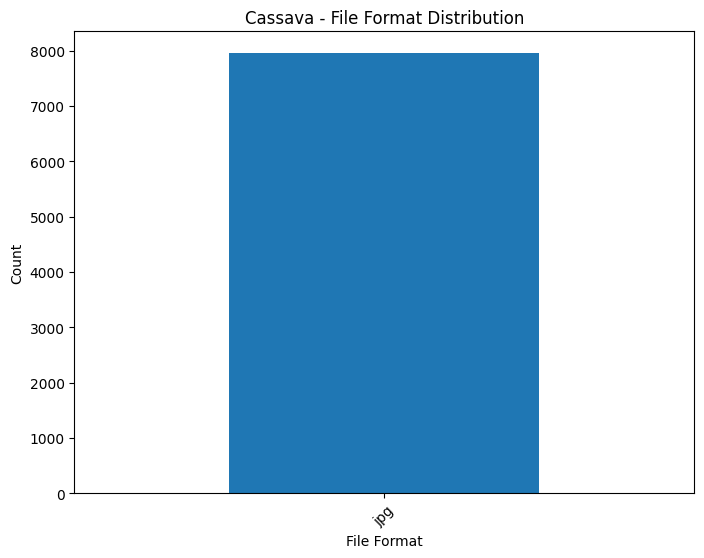

In [7]:
# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# EDA for Maize dataset and cassava
def plot_eda(df_images, title):
    # Class distribution (Bar Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='bar')
    plt.title(f'{title} - Class Distribution (Bar Chart)')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # Class distribution (Pie Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90)
    plt.title(f'{title} - Class Distribution (Pie Chart)')
    plt.ylabel('')
    plt.show()

    # Number of Images per Class (Bar Chart)
    class_counts = df_images['class'].value_counts()
    class_counts.plot(kind='bar', figsize=(10, 6))
    plt.title(f'{title} - Number of Images per Class')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # File Format Distribution (Bar Chart)
    file_formats = df_images['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
    file_formats.plot(kind='bar', figsize=(8, 6))
    plt.title(f'{title} - File Format Distribution')
    plt.xlabel('File Format')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Plot EDA for Maize dataset
plot_eda(df_maize, 'Maize')

# Plot EDA for Cassava dataset
plot_eda(df_cassava, 'Cassava')

In [8]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

## Preparing Image dataset for both images and creating a data frame


                                          image_path                class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm


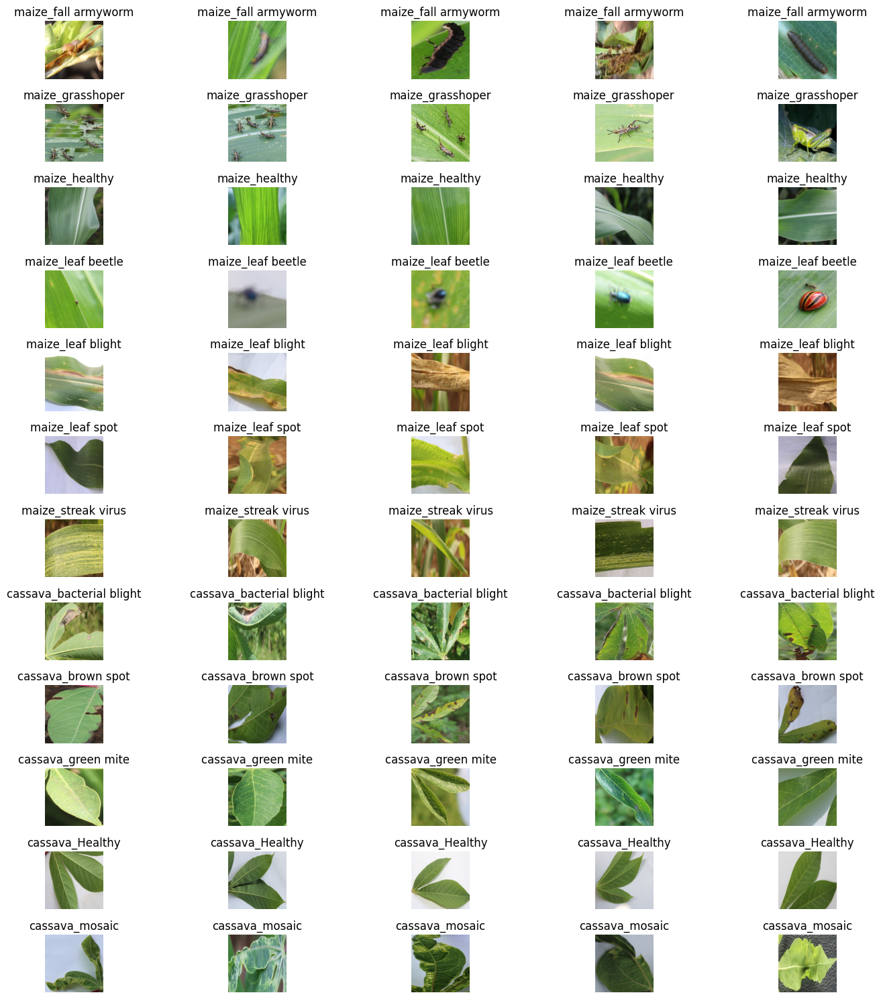

In [9]:
# Define base directories for both datasets
maize_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
cassava_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'

# Folder names for Maize dataset
maize_folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Folder names for Cassava dataset
cassava_folders = ['bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Remove invalid images before training for both datasets
for folder in maize_folders:
    remove_invalid_images(os.path.join(maize_base_dir, folder))
for folder in cassava_folders:
    remove_invalid_images(os.path.join(cassava_base_dir, folder))

# Create a DataFrame for the images in both datasets
image_paths = []
image_classes = []

# Maize dataset
for folder in maize_folders:
    folder_path = os.path.join(maize_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"maize_{folder}")

# Cassava dataset
for folder in cassava_folders:
    folder_path = os.path.join(cassava_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"cassava_{folder}")

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(maize_folders) + len(cassava_folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(maize_folders + cassava_folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'].str.contains(folder)].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

### Printing number of unique classes

In [10]:
unique_classes = df_images['class'].nunique()
print(f"Number of classes in the dataset: {unique_classes}")

Number of classes in the dataset: 12


### Combining Maize and Cassava Dataframes and creating splits into train, test and validation (80%, 10%, 10%)

In [11]:
# Combine the Maize and Cassava DataFrames
df_combined = pd.concat([df_maize, df_cassava], ignore_index=True)

# Split into training (80%), testing (10%), and validation (10%)
train_df, test_df = train_test_split(df_combined, test_size=0.2, stratify=df_combined['class'], random_state=42)
valid_df, test_df = train_test_split(test_df, test_size=0.5, stratify=test_df['class'], random_state=42)

# Display the counts for each dataset to verify
print(f"Training set: {train_df.shape[0]} images")
print(f"Validation set: {valid_df.shape[0]} images")
print(f"Testing set: {test_df.shape[0]} images")

# Optional: Check the distribution of classes in each set
print("\nTraining set class distribution:")
print(train_df['class'].value_counts())

print("\nValidation set class distribution:")
print(valid_df['class'].value_counts())

print("\nTesting set class distribution:")
print(test_df['class'].value_counts())

Training set: 10648 images
Validation set: 1331 images
Testing set: 1332 images

Training set class distribution:
class
bacterial blight    2218
brown spot          1205
Healthy             1026
leaf spot            999
mosaic               988
green mite           923
streak virus         802
leaf blight          798
leaf beetle          750
grasshoper           546
fall armyworm        228
healthy              165
Name: count, dtype: int64

Validation set class distribution:
class
bacterial blight    277
brown spot          150
Healthy             128
leaf spot           125
mosaic              123
green mite          115
streak virus        100
leaf blight         100
leaf beetle          94
grasshoper           69
fall armyworm        29
healthy              21
Name: count, dtype: int64

Testing set class distribution:
class
bacterial blight    277
brown spot          151
Healthy             129
leaf spot           125
mosaic              124
green mite          116
leaf blight    

In [12]:
!pip install keras-tuner --quiet

### Image Data Generator to load and Augment Images in Batches

In [13]:
# Data generators to load and augment images in batches
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
# Train, valid and test generator
train_generator = train_datagen.flow_from_dataframe(dataframe=train_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(dataframe=valid_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(dataframe=test_df, directory=None,
                                                  x_col='image_path', y_col='class',
                                                  target_size=(150, 150), batch_size=32,
                                                  class_mode='categorical')

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.


# Building of Models

## CNN Models (Non pre trained)

## 10 Epochs

In [14]:
# Build the CNN Model
model= Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])
# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define a checkpoint to save the best model during training
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Train the model
history = model.fit(train_generator, epochs=10, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2148 - loss: 2.2724
Epoch 1: val_loss improved from inf to 1.77343, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 610s 2s/step - accuracy: 0.2149 - loss: 2.2720 - val_accuracy: 0.3569 - val_loss: 1.7734
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3510 - loss: 1.8605
Epoch 2: val_loss improved from 1.77343 to 1.36027, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 591s 2s/step - accuracy: 0.3511 - loss: 1.8604 - val_accuracy: 0.5237 - val_loss: 1.3603
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4237 - loss: 1.6355
Epoch 3: val_loss improved from 1.36027 to 1.32301, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 590s 2s/step - accuracy: 0.4238 - loss: 1.6353 - val_accuracy: 0.5319 - val_loss: 1.3230
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4921 - loss: 1.4516
Epoch 4: val_loss improved from 1.32301 to 1.07775, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 587s 2s/step - accuracy: 0.4922 - loss: 1.4515 - val_accuracy: 0.6319 - val_loss: 1.0778
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5292 - loss: 1.3392
Epoch 5: val_loss improved from 1.07775 to 1.01358, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 609s 2s/step - accuracy: 0.5293 - loss: 1.3391 - val_accuracy: 0.6461 - val_loss: 1.0136
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5808 - loss: 1.2162
Epoch 6: val_loss did not improve from 1.01358
333/333 ━━━━━━━━━━━━━━━━━━━━ 584s 2s/step - accuracy: 0.5808 - loss: 1.2161 - val_accuracy: 0.6176 - val_loss: 1.1385
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6058 - loss: 1.1329
Epoch 7: val_loss improved from 1.01358 to 0.90118, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 581s 2s/step - accuracy: 0.6058 - loss: 1.1329 - val_accuracy: 0.6875 - val_loss: 0.9012
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6229 - loss: 1.0817
Epoch 8: val_loss improved from 0.90118 to 0.82581, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 581s 2s/step - accuracy: 0.6229 - loss: 1.0817 - val_accuracy: 0.7137 - val_loss: 0.8258
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6442 - loss: 1.0336
Epoch 9: val_loss did not improve from 0.82581
333/333 ━━━━━━━━━━━━━━━━━━━━ 577s 2s/step - accuracy: 0.6443 - loss: 1.0336 - val_accuracy: 0.6905 - val_loss: 0.9095
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6611 - loss: 0.9613
Epoch 10: val_loss did not improve from 0.82581
333/333 ━━━━━━━━━━━━━━━━━━━━ 591s 2s/step - accuracy: 0.6611 - loss: 0.9614 - val_accuracy: 0.7002 - val_loss: 0.8262
42/42 ━━━━━━━━━━━━━━━━━━━━ 23s 542ms/step - accuracy: 0.7102 - loss: 0.8313
Test accuracy: 0.7185


## training and validation on Cnn on 10 epoch

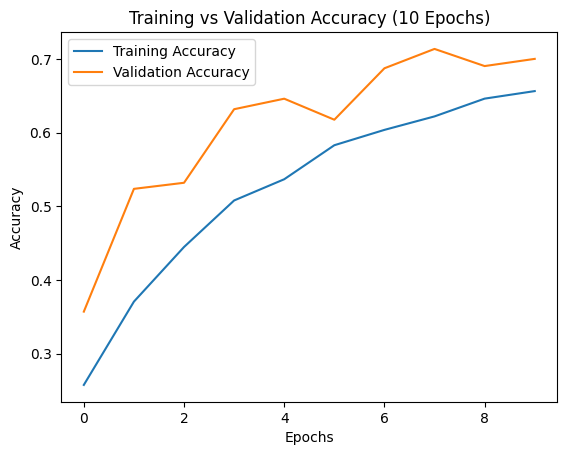

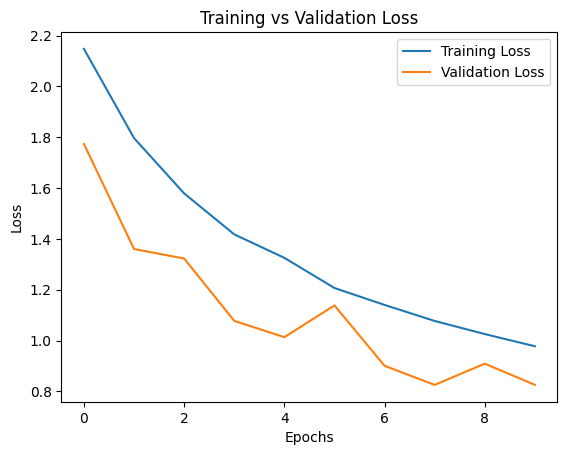

In [15]:
# Plot the training and validation accuracy fo 10 Epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (10 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Evaluation on cnn model on 10 epoch


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

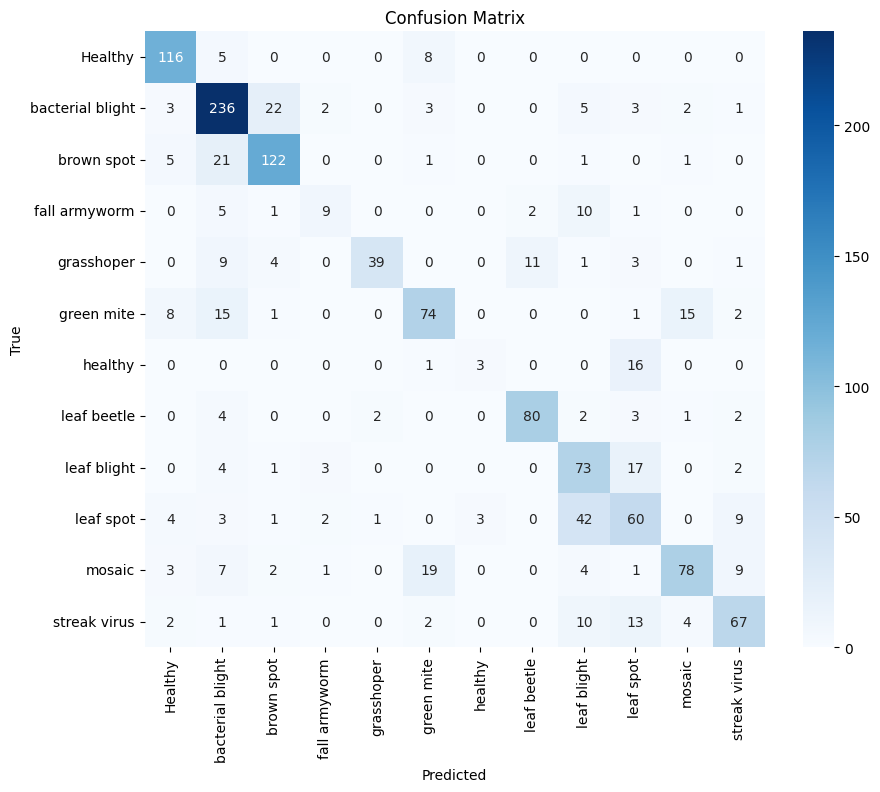

In [16]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## CNN FOR 20 EPOCHS

In [17]:
# Train the model
history1 = model.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6681 - loss: 0.9436
Epoch 1: val_loss improved from 0.82581 to 0.78502, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 579s 2s/step - accuracy: 0.6681 - loss: 0.9436 - val_accuracy: 0.7100 - val_loss: 0.7850
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6859 - loss: 0.8915
Epoch 2: val_loss improved from 0.78502 to 0.75177, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 567s 2s/step - accuracy: 0.6859 - loss: 0.8915 - val_accuracy: 0.7453 - val_loss: 0.7518
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6865 - loss: 0.8629
Epoch 3: val_loss did not improve from 0.75177
333/333 ━━━━━━━━━━━━━━━━━━━━ 621s 2s/step - accuracy: 0.6865 - loss: 0.8630 - val_accuracy: 0.7438 - val_loss: 0.7560
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6944 - loss: 0.8526
Epoch 4: val_loss did not improve from 0.75177
333/333 ━━━━━━━━━━━━━━━━━━━━ 624s 2s/step - accuracy: 0.6944 - loss: 0.8526 - val_accuracy: 0.7310 - val_loss: 0.8191
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6960 - loss: 0.8427
Epoch 5: val_loss improved from 0.75177 to 0.65589, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 570s 2s/step - accuracy: 0.6960 - loss: 0.8426 - val_accuracy: 0.7671 - val_loss: 0.6559
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7063 - loss: 0.8414
Epoch 6: val_loss did not improve from 0.65589
333/333 ━━━━━━━━━━━━━━━━━━━━ 572s 2s/step - accuracy: 0.7063 - loss: 0.8413 - val_accuracy: 0.7506 - val_loss: 0.7081
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7192 - loss: 0.7855
Epoch 7: val_loss did not improve from 0.65589
333/333 ━━━━━━━━━━━━━━━━━━━━ 570s 2s/step - accuracy: 0.7192 - loss: 0.7855 - val_accuracy: 0.7378 - val_loss: 0.7116
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7253 - loss: 0.7869
Epoch 8: val_loss improved from 0.65589 to 0.63102, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 568s 2s/step - accuracy: 0.7253 - loss: 0.7869 - val_accuracy: 0.7859 - val_loss: 0.6310
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7432 - loss: 0.7349
Epoch 9: val_loss improved from 0.63102 to 0.59637, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 566s 2s/step - accuracy: 0.7432 - loss: 0.7349 - val_accuracy: 0.7986 - val_loss: 0.5964
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7378 - loss: 0.7310
Epoch 10: val_loss did not improve from 0.59637
333/333 ━━━━━━━━━━━━━━━━━━━━ 565s 2s/step - accuracy: 0.7378 - loss: 0.7310 - val_accuracy: 0.7528 - val_loss: 0.7326
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7448 - loss: 0.7186
Epoch 11: val_loss did not improve from 0.59637
333/333 ━━━━━━━━━━━━━━━━━━━━ 565s 2s/step - accuracy: 0.7447 - loss: 0.7186 - val_accuracy: 0.7724 - val_loss: 0.6555
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7437 - loss: 0.7175
Epoch 12: val_loss did not improve from 0.59637
333/333 ━━━━━━━━━━━━━━━━━━━━ 567s 2s/step - accuracy: 0.7436 - loss: 0.7176 - val_accuracy: 0.7881 - val_loss: 0.6290
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7453 - loss: 0.7012
Epoch 13: val_loss improved from 0.59637

333/333 ━━━━━━━━━━━━━━━━━━━━ 642s 2s/step - accuracy: 0.7453 - loss: 0.7012 - val_accuracy: 0.8024 - val_loss: 0.5567
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7647 - loss: 0.6633
Epoch 14: val_loss did not improve from 0.55668
333/333 ━━━━━━━━━━━━━━━━━━━━ 569s 2s/step - accuracy: 0.7647 - loss: 0.6634 - val_accuracy: 0.8047 - val_loss: 0.5916
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7526 - loss: 0.6985
Epoch 15: val_loss improved from 0.55668 to 0.50062, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 573s 2s/step - accuracy: 0.7526 - loss: 0.6985 - val_accuracy: 0.8129 - val_loss: 0.5006
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7561 - loss: 0.6843
Epoch 16: val_loss did not improve from 0.50062
333/333 ━━━━━━━━━━━━━━━━━━━━ 618s 2s/step - accuracy: 0.7561 - loss: 0.6843 - val_accuracy: 0.7986 - val_loss: 0.6077
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7653 - loss: 0.6537
Epoch 17: val_loss did not improve from 0.50062
333/333 ━━━━━━━━━━━━━━━━━━━━ 566s 2s/step - accuracy: 0.7653 - loss: 0.6537 - val_accuracy: 0.8062 - val_loss: 0.5919
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7654 - loss: 0.6685
Epoch 18: val_loss did not improve from 0.50062
333/333 ━━━━━━━━━━━━━━━━━━━━ 624s 2s/step - accuracy: 0.7653 - loss: 0.6685 - val_accuracy: 0.7791 - val_loss: 0.6874
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7726 - loss: 0.6364
Epoch 19: val_loss did not improve from 

333/333 ━━━━━━━━━━━━━━━━━━━━ 565s 2s/step - accuracy: 0.7700 - loss: 0.6306 - val_accuracy: 0.8340 - val_loss: 0.4859
42/42 ━━━━━━━━━━━━━━━━━━━━ 23s 535ms/step - accuracy: 0.8184 - loss: 0.5033
Test accuracy: 0.8153


## training and validation accuracy and loss of cnn on 20 epoch

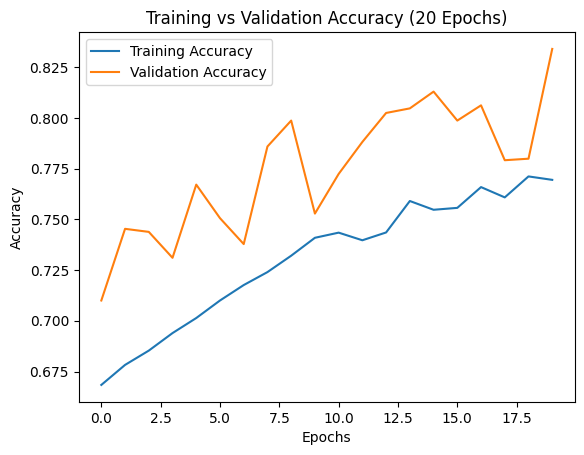

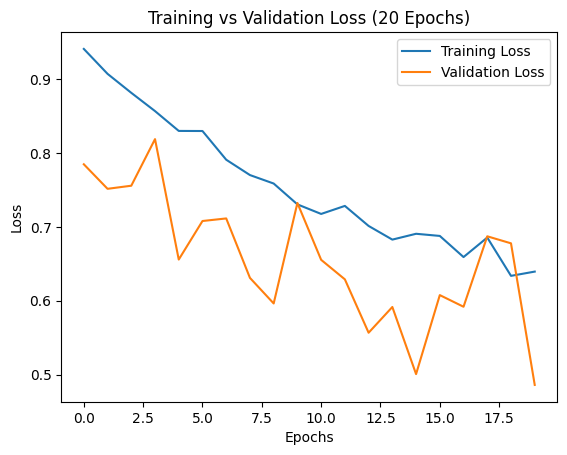

In [18]:
# Plot the training and validation accuracy for 20 epochs
plt.plot(history1.history['accuracy'], label='Training Accuracy')
plt.plot(history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

 ## evaluation of cnn model on 20 epoch

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

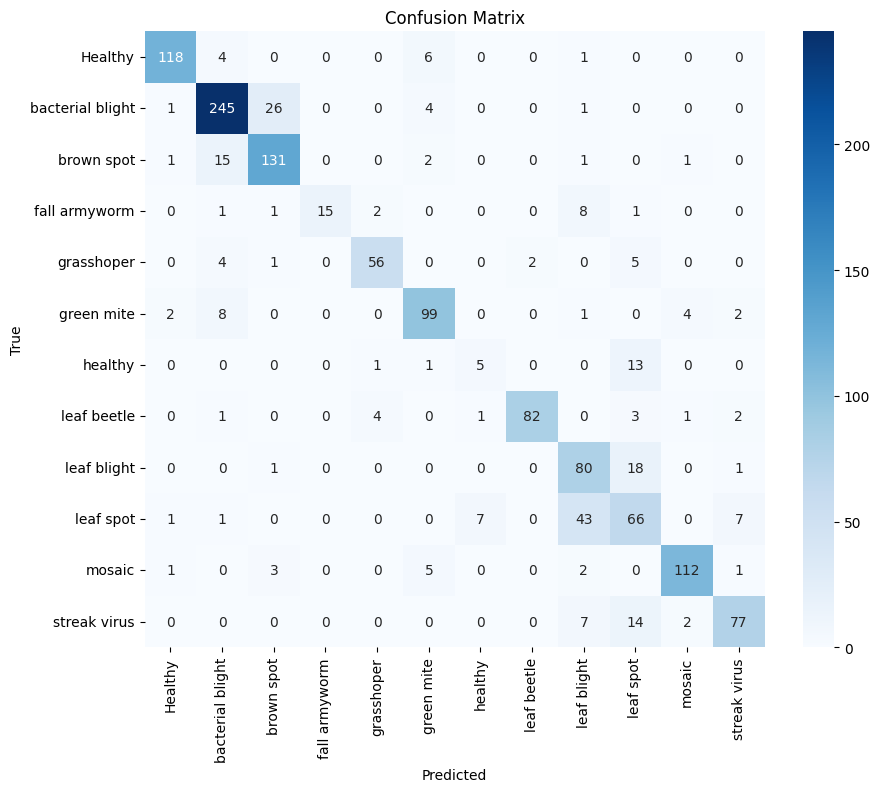

In [19]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## CNN model on 30 epoch

In [20]:
# Train the model
history2 = model.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7670 - loss: 0.6495
Epoch 1: val_loss did not improve from 0.48593
333/333 ━━━━━━━━━━━━━━━━━━━━ 592s 2s/step - accuracy: 0.7670 - loss: 0.6495 - val_accuracy: 0.7971 - val_loss: 0.5971
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7690 - loss: 0.6442
Epoch 2: val_loss did not improve from 0.48593
333/333 ━━━━━━━━━━━━━━━━━━━━ 568s 2s/step - accuracy: 0.7690 - loss: 0.6442 - val_accuracy: 0.8189 - val_loss: 0.4881
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7804 - loss: 0.6096
Epoch 3: val_loss did not improve from 0.48593
333/333 ━━━━━━━━━━━━━━━━━━━━ 567s 2s/step - accuracy: 0.7804 - loss: 0.6096 - val_accuracy: 0.8129 - val_loss: 0.5638
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7706 - loss: 0.6473
Epoch 4: val_loss did not improve from 0.48593
333/333 ━━━━━━━━━━━━━━━━━━━━ 587s 2s/step - accuracy: 0.7706 - loss: 0.6473 - val_accuracy: 0.8234 - val_loss: 0.5493


333/333 ━━━━━━━━━━━━━━━━━━━━ 567s 2s/step - accuracy: 0.7878 - loss: 0.5940 - val_accuracy: 0.8340 - val_loss: 0.4698
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7810 - loss: 0.5875
Epoch 7: val_loss did not improve from 0.46976
333/333 ━━━━━━━━━━━━━━━━━━━━ 566s 2s/step - accuracy: 0.7810 - loss: 0.5875 - val_accuracy: 0.8069 - val_loss: 0.5196
Epoch 8/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7837 - loss: 0.6102
Epoch 8: val_loss improved from 0.46976 to 0.44091, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 569s 2s/step - accuracy: 0.7837 - loss: 0.6102 - val_accuracy: 0.8415 - val_loss: 0.4409
Epoch 9/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7922 - loss: 0.5638
Epoch 9: val_loss did not improve from 0.44091
333/333 ━━━━━━━━━━━━━━━━━━━━ 584s 2s/step - accuracy: 0.7922 - loss: 0.5639 - val_accuracy: 0.8099 - val_loss: 0.5937
Epoch 10/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7695 - loss: 0.6368
Epoch 10: val_loss did not improve from 0.44091
333/333 ━━━━━━━━━━━━━━━━━━━━ 565s 2s/step - accuracy: 0.7695 - loss: 0.6367 - val_accuracy: 0.8257 - val_loss: 0.4629
Epoch 11/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8013 - loss: 0.5777
Epoch 11: val_loss did not improve from 0.44091
333/333 ━━━━━━━━━━━━━━━━━━━━ 563s 2s/step - accuracy: 0.8012 - loss: 0.5777 - val_accuracy: 0.8069 - val_loss: 0.6415
Epoch 12/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7922 - loss: 0.5645
Epoch 12: val_loss did not improve from 0.

333/333 ━━━━━━━━━━━━━━━━━━━━ 564s 2s/step - accuracy: 0.8184 - loss: 0.4943 - val_accuracy: 0.8633 - val_loss: 0.4042
Epoch 25/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8248 - loss: 0.5052
Epoch 25: val_loss improved from 0.40423 to 0.39128, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 565s 2s/step - accuracy: 0.8248 - loss: 0.5052 - val_accuracy: 0.8512 - val_loss: 0.3913
Epoch 26/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8122 - loss: 0.5239
Epoch 26: val_loss did not improve from 0.39128
333/333 ━━━━━━━━━━━━━━━━━━━━ 591s 2s/step - accuracy: 0.8122 - loss: 0.5238 - val_accuracy: 0.8415 - val_loss: 0.4338
Epoch 27/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8238 - loss: 0.5011
Epoch 27: val_loss did not improve from 0.39128
333/333 ━━━━━━━━━━━━━━━━━━━━ 569s 2s/step - accuracy: 0.8238 - loss: 0.5011 - val_accuracy: 0.8482 - val_loss: 0.4258
Epoch 28/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8112 - loss: 0.5295
Epoch 28: val_loss improved from 0.39128 to 0.38416, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 621s 2s/step - accuracy: 0.8112 - loss: 0.5294 - val_accuracy: 0.8618 - val_loss: 0.3842
Epoch 29/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8229 - loss: 0.4829
Epoch 29: val_loss did not improve from 0.38416
333/333 ━━━━━━━━━━━━━━━━━━━━ 570s 2s/step - accuracy: 0.8229 - loss: 0.4829 - val_accuracy: 0.8460 - val_loss: 0.4585
Epoch 30/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8194 - loss: 0.4904
Epoch 30: val_loss did not improve from 0.38416
333/333 ━━━━━━━━━━━━━━━━━━━━ 563s 2s/step - accuracy: 0.8194 - loss: 0.4904 - val_accuracy: 0.8400 - val_loss: 0.4521
42/42 ━━━━━━━━━━━━━━━━━━━━ 21s 487ms/step - accuracy: 0.8349 - loss: 0.5018
Test accuracy: 0.8326


## training and validation accuracy and loss of cnn on 30 epoch

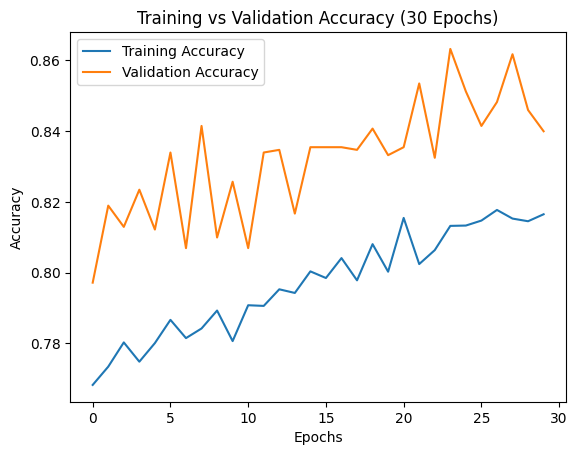

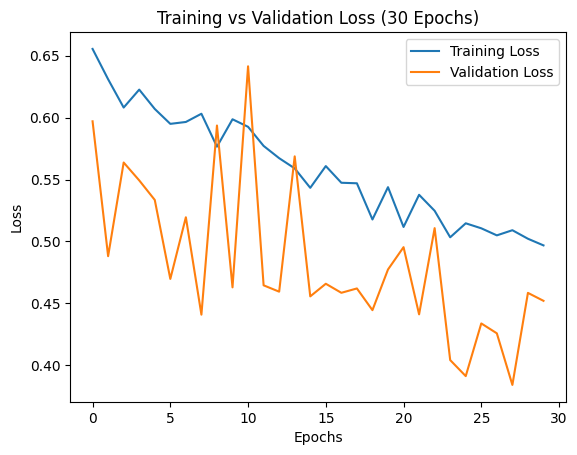

In [21]:
# Plot the training and validation accuracy for 30 epochs
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss for 30 epochs
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## evaluation of cnn model on 30 epoch

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

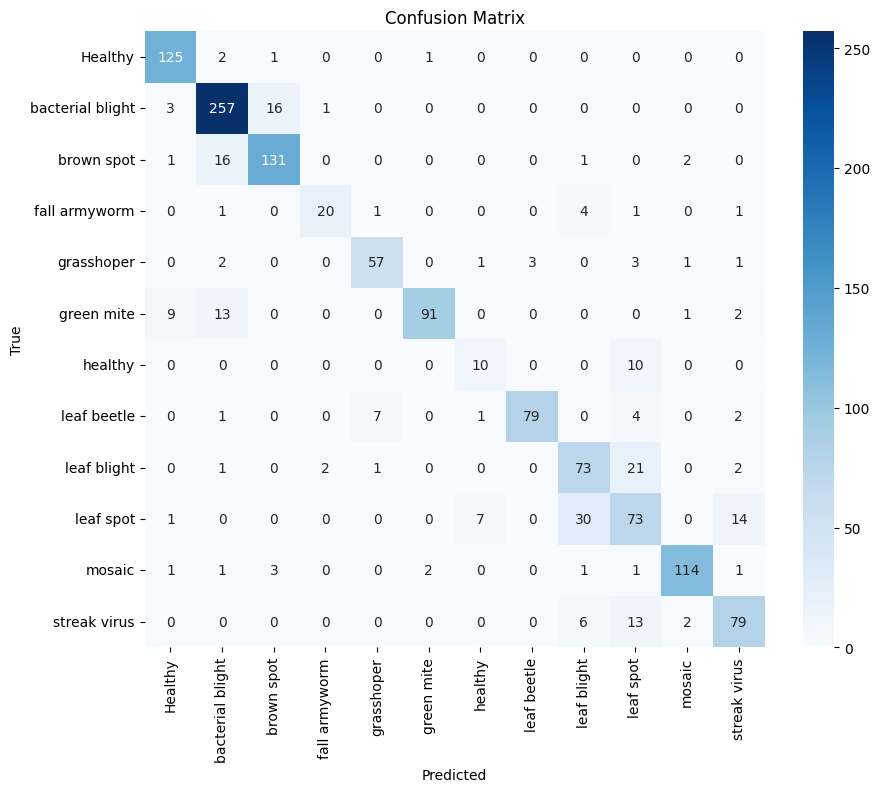

In [22]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Algorithm comparison for 3 CNN Epoch models

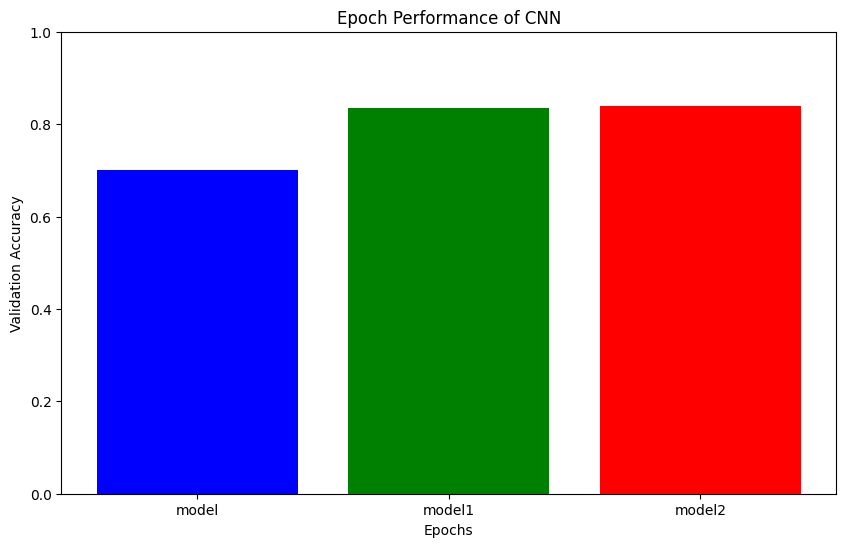

In [23]:
# Code to compare the cnn epoch performance of 10, 20, 30
accuracy_scores = [
    history.history['val_accuracy'][-1],  # Accuracy after 10 epochs
    history1.history['val_accuracy'][-1], # Accuracy after 20 epochs
    history2.history['val_accuracy'][-1]  # Accuracy after 30 epochs
]

algorithms = ['model', 'model1', 'model2']

plt.figure(figsize=(10, 6))
plt.bar(algorithms, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.title('Epoch Performance of CNN')
plt.ylim([0, 1])
plt.show()

# VGG16 on 10 epochs using early stopping techniques


In [14]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained VGG16 model without the top layer for transfer learning
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False
# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of VGG16
VGG16_model1 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
VGG16_model1.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
VGG16_history1 = VGG16_model1.fit(train_generator, epochs=10, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model1.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.3727 - loss: 1.8416
Epoch 1: val_loss improved from inf to 1.04870, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 108s 297ms/step - accuracy: 0.3730 - loss: 1.8407 - val_accuracy: 0.6349 - val_loss: 1.0487
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.5777 - loss: 1.1860
Epoch 2: val_loss improved from 1.04870 to 0.89151, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 263ms/step - accuracy: 0.5778 - loss: 1.1859 - val_accuracy: 0.6844 - val_loss: 0.8915
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.6219 - loss: 1.0467
Epoch 3: val_loss improved from 0.89151 to 0.81867, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.6219 - loss: 1.0467 - val_accuracy: 0.7130 - val_loss: 0.8187
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.6483 - loss: 0.9693
Epoch 4: val_loss improved from 0.81867 to 0.79863, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 262ms/step - accuracy: 0.6483 - loss: 0.9693 - val_accuracy: 0.7122 - val_loss: 0.7986
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.6585 - loss: 0.9537
Epoch 5: val_loss improved from 0.79863 to 0.76959, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.6585 - loss: 0.9537 - val_accuracy: 0.7228 - val_loss: 0.7696
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.6668 - loss: 0.9135
Epoch 6: val_loss did not improve from 0.76959
333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 259ms/step - accuracy: 0.6668 - loss: 0.9135 - val_accuracy: 0.7153 - val_loss: 0.7863
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.6729 - loss: 0.8839
Epoch 7: val_loss improved from 0.76959 to 0.71343, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.6730 - loss: 0.8839 - val_accuracy: 0.7476 - val_loss: 0.7134
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.6881 - loss: 0.8545
Epoch 8: val_loss did not improve from 0.71343
333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 259ms/step - accuracy: 0.6881 - loss: 0.8546 - val_accuracy: 0.7431 - val_loss: 0.7136
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.6926 - loss: 0.8604
Epoch 9: val_loss did not improve from 0.71343
333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 260ms/step - accuracy: 0.6926 - loss: 0.8604 - val_accuracy: 0.7273 - val_loss: 0.7435
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.6951 - loss: 0.8496
Epoch 10: val_loss improved from 0.71343 to 0.69036, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 261ms/step - accuracy: 0.6951 - loss: 0.8496 - val_accuracy: 0.7438 - val_loss: 0.6904
Restoring model weights from the end of the best epoch: 10.
42/42 ━━━━━━━━━━━━━━━━━━━━ 11s 256ms/step - accuracy: 0.7151 - loss: 0.6883
Test accuracy: 0.7192


## Training and Validation Accuracy and Loss 10 Epochs

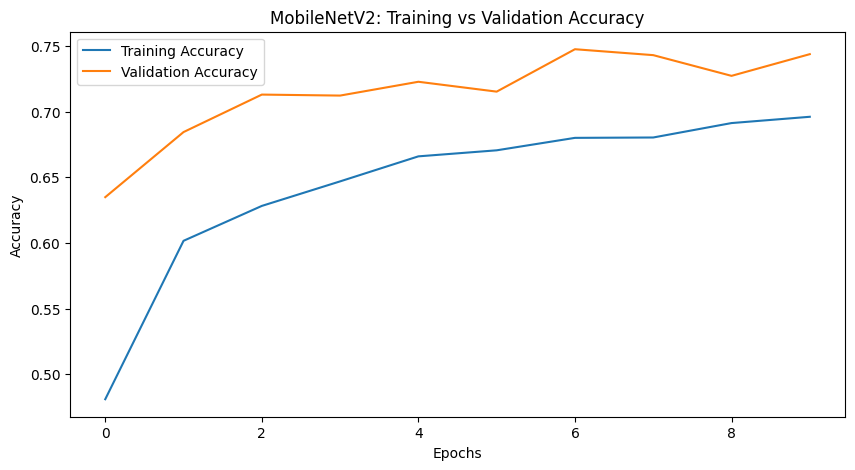

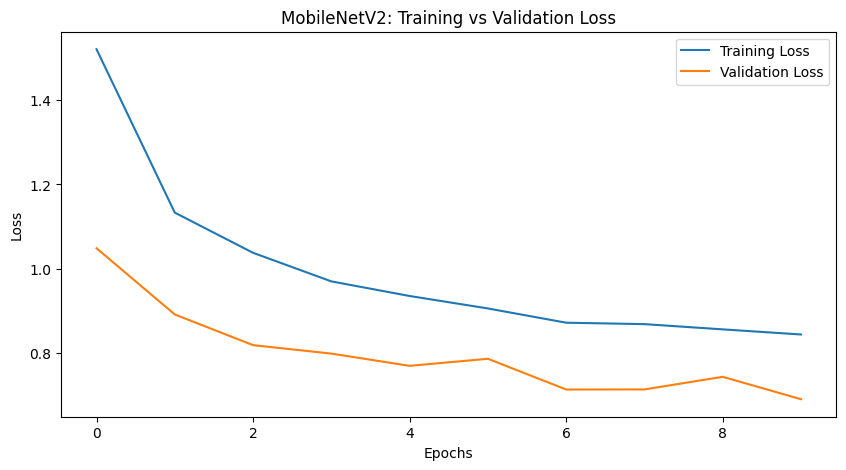

In [15]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history1.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history1.history['loss'], label='Training Loss')
plt.plot(VGG16_history1.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for 10 epochs VGG16

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

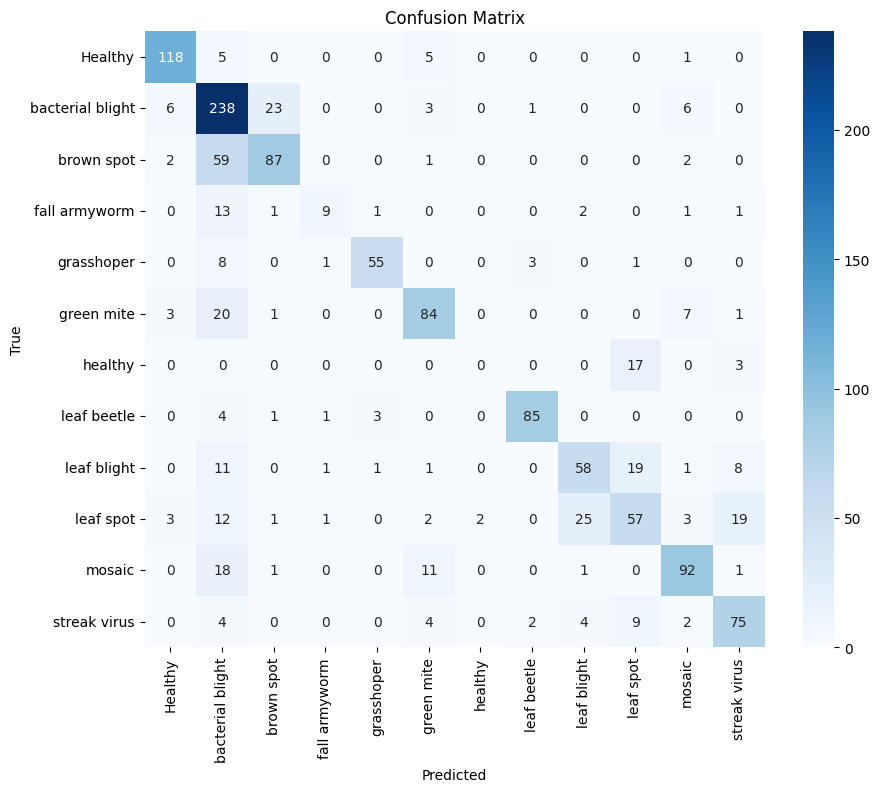

In [16]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = VGG16_model1.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## VGG16 on 20 epochs using early stopping techniques

In [17]:
# Train the model
VGG16_history2 = VGG16_model1.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model1.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.6939 - loss: 0.8232
Epoch 1: val_loss did not improve from 0.69036
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 264ms/step - accuracy: 0.6939 - loss: 0.8232 - val_accuracy: 0.7378 - val_loss: 0.7200
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.6949 - loss: 0.8053
Epoch 2: val_loss improved from 0.69036 to 0.68373, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 259ms/step - accuracy: 0.6949 - loss: 0.8053 - val_accuracy: 0.7543 - val_loss: 0.6837
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.7075 - loss: 0.8003
Epoch 3: val_loss improved from 0.68373 to 0.67075, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 260ms/step - accuracy: 0.7075 - loss: 0.8003 - val_accuracy: 0.7551 - val_loss: 0.6708
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.7075 - loss: 0.7873
Epoch 4: val_loss did not improve from 0.67075
333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 261ms/step - accuracy: 0.7075 - loss: 0.7873 - val_accuracy: 0.7408 - val_loss: 0.6920
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.7134 - loss: 0.7779
Epoch 5: val_loss improved from 0.67075 to 0.66224, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 261ms/step - accuracy: 0.7134 - loss: 0.7780 - val_accuracy: 0.7476 - val_loss: 0.6622
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.7088 - loss: 0.7766
Epoch 6: val_loss improved from 0.66224 to 0.65153, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 259ms/step - accuracy: 0.7088 - loss: 0.7765 - val_accuracy: 0.7656 - val_loss: 0.6515
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.7119 - loss: 0.7614
Epoch 7: val_loss improved from 0.65153 to 0.63986, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 260ms/step - accuracy: 0.7119 - loss: 0.7614 - val_accuracy: 0.7656 - val_loss: 0.6399
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.7260 - loss: 0.7515
Epoch 8: val_loss improved from 0.63986 to 0.62614, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.7260 - loss: 0.7515 - val_accuracy: 0.7686 - val_loss: 0.6261
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.7243 - loss: 0.7393
Epoch 9: val_loss did not improve from 0.62614
333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 259ms/step - accuracy: 0.7243 - loss: 0.7393 - val_accuracy: 0.7528 - val_loss: 0.6475
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.7257 - loss: 0.7373
Epoch 10: val_loss did not improve from 0.62614
333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 257ms/step - accuracy: 0.7257 - loss: 0.7373 - val_accuracy: 0.7708 - val_loss: 0.6304
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.7239 - loss: 0.7325
Epoch 11: val_loss did not improve from 0.62614
333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 259ms/step - accuracy: 0.7239 - loss: 0.7325 - val_accuracy: 0.7618 - val_loss: 0.6520
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.7279 - loss: 0.7396
Epoch 12: val_loss imp

333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 259ms/step - accuracy: 0.7279 - loss: 0.7396 - val_accuracy: 0.7678 - val_loss: 0.6223
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.7270 - loss: 0.7314
Epoch 13: val_loss improved from 0.62232 to 0.60869, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.7271 - loss: 0.7314 - val_accuracy: 0.7746 - val_loss: 0.6087
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.7313 - loss: 0.7281
Epoch 14: val_loss did not improve from 0.60869
333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.7313 - loss: 0.7281 - val_accuracy: 0.7656 - val_loss: 0.6207
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7327 - loss: 0.7209
Epoch 15: val_loss did not improve from 0.60869
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 268ms/step - accuracy: 0.7327 - loss: 0.7209 - val_accuracy: 0.7724 - val_loss: 0.6445
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.7306 - loss: 0.7393
Epoch 16: val_loss did not improve from 0.60869
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 270ms/step - accuracy: 0.7306 - loss: 0.7393 - val_accuracy: 0.7626 - val_loss: 0.6297
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.7435 - loss: 0.6890
Epoch 17: val_loss d

333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.7427 - loss: 0.6973 - val_accuracy: 0.7814 - val_loss: 0.5944
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.7463 - loss: 0.6959
Epoch 19: val_loss did not improve from 0.59441
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 264ms/step - accuracy: 0.7463 - loss: 0.6959 - val_accuracy: 0.7739 - val_loss: 0.6040
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.7416 - loss: 0.6821
Epoch 20: val_loss did not improve from 0.59441
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 263ms/step - accuracy: 0.7416 - loss: 0.6821 - val_accuracy: 0.7844 - val_loss: 0.5976
Restoring model weights from the end of the best epoch: 18.
42/42 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - accuracy: 0.7769 - loss: 0.6066
Test accuracy: 0.7673


## Training and validation accuracy and loss on 20 epochs

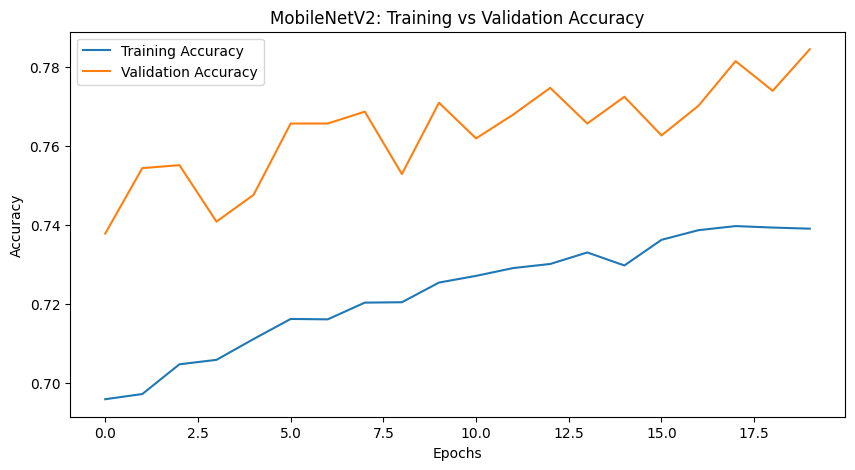

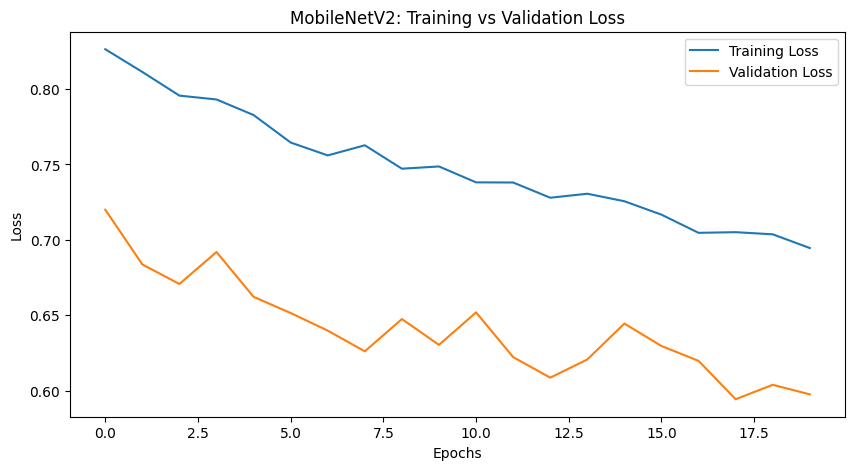

In [18]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history2.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history2.history['loss'], label='Training Loss')
plt.plot(VGG16_history2.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##  Model evaluation VGG16 on 20 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

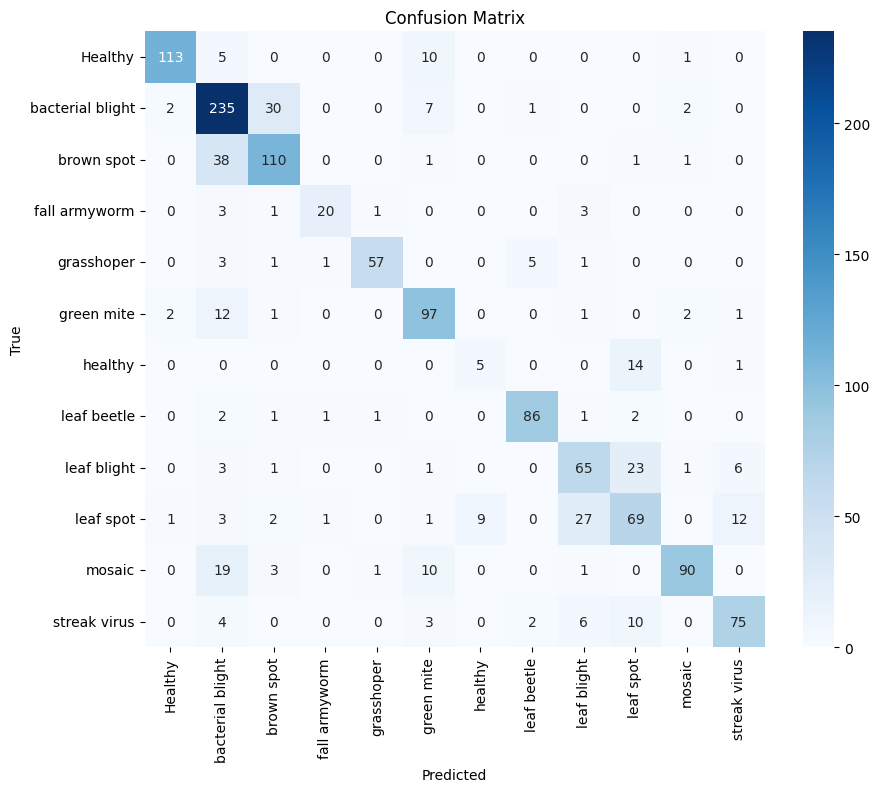

In [19]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = VGG16_model1.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## VGG16 on 30 epochs using early stopping techniques

In [20]:
VGG16_history3 = VGG16_model1.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model1.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.7463 - loss: 0.7068
Epoch 1: val_loss did not improve from 0.59441
333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 261ms/step - accuracy: 0.7462 - loss: 0.7068 - val_accuracy: 0.7784 - val_loss: 0.5952
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.7405 - loss: 0.7050
Epoch 2: val_loss improved from 0.59441 to 0.58695, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 262ms/step - accuracy: 0.7405 - loss: 0.7050 - val_accuracy: 0.7859 - val_loss: 0.5869
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.7374 - loss: 0.6900
Epoch 3: val_loss did not improve from 0.58695
333/333 ━━━━━━━━━━━━━━━━━━━━ 86s 258ms/step - accuracy: 0.7374 - loss: 0.6900 - val_accuracy: 0.7746 - val_loss: 0.6073
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7465 - loss: 0.6569
Epoch 4: val_loss did not improve from 0.58695
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.7465 - loss: 0.6570 - val_accuracy: 0.7806 - val_loss: 0.6163
Epoch 5/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7483 - loss: 0.6653
Epoch 5: val_loss improved from 0.58695 to 0.56293, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7483 - loss: 0.6654 - val_accuracy: 0.7874 - val_loss: 0.5629
Epoch 6/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.7351 - loss: 0.7136
Epoch 6: val_loss did not improve from 0.56293
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 271ms/step - accuracy: 0.7351 - loss: 0.7136 - val_accuracy: 0.7844 - val_loss: 0.5912
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.7401 - loss: 0.6986
Epoch 7: val_loss did not improve from 0.56293
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.7401 - loss: 0.6986 - val_accuracy: 0.7836 - val_loss: 0.6031
Epoch 8/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.7527 - loss: 0.6519
Epoch 8: val_loss did not improve from 0.56293
333/333 ━━━━━━━━━━━━━━━━━━━━ 87s 260ms/step - accuracy: 0.7527 - loss: 0.6520 - val_accuracy: 0.7791 - val_loss: 0.5799
Epoch 9/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.7438 - loss: 0.6786
Epoch 9: val_loss did not i

## Training and validation accuraacy, loss on 30 epochs

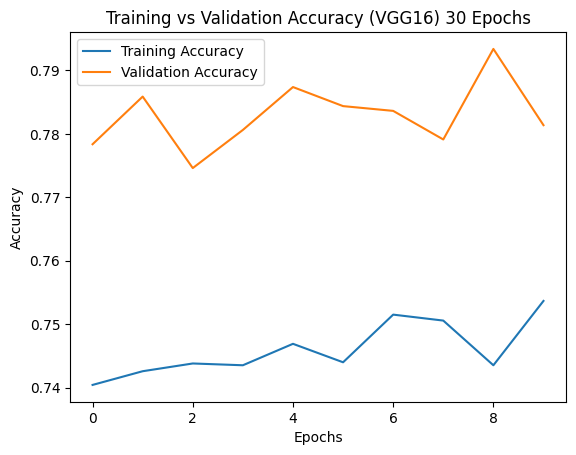

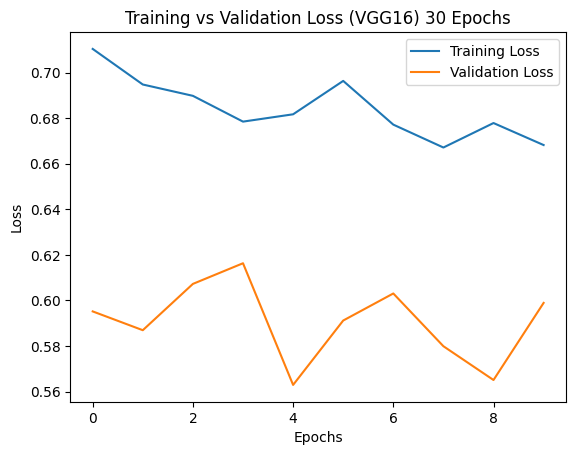

In [21]:
# Plot the training and validation accuracy
plt.plot(VGG16_history3.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (VGG16) 30 Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(VGG16_history3.history['loss'], label='Training Loss')
plt.plot(VGG16_history3.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (VGG16) 30 Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for VGG16 on 30 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

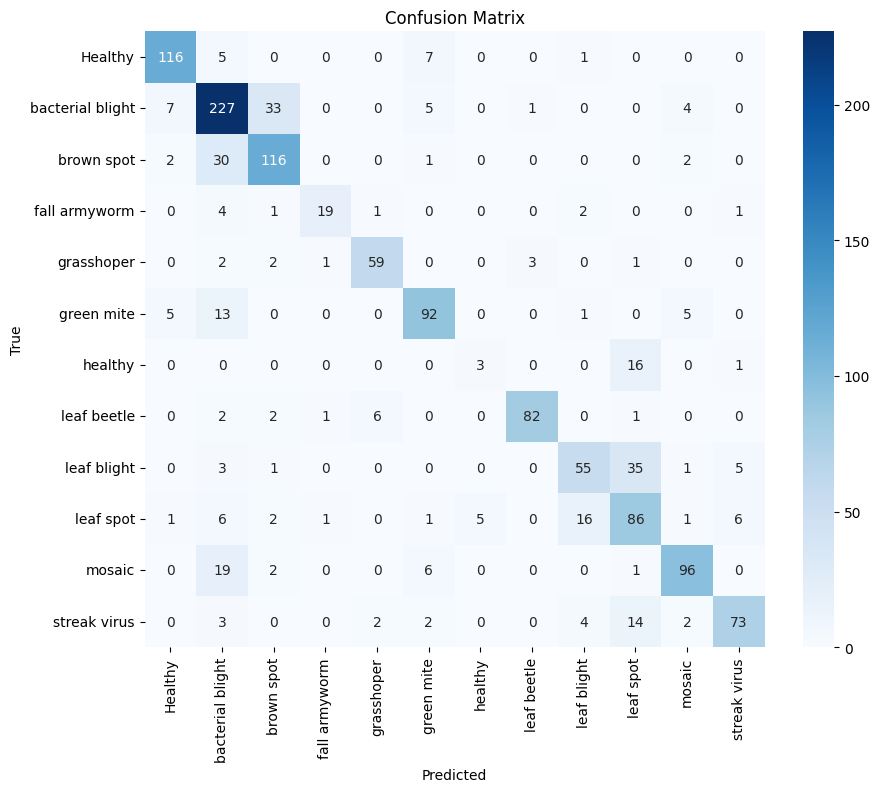

In [22]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = VGG16_model1.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Algorithm comparison for 3 VGG16 epochs without early stopping

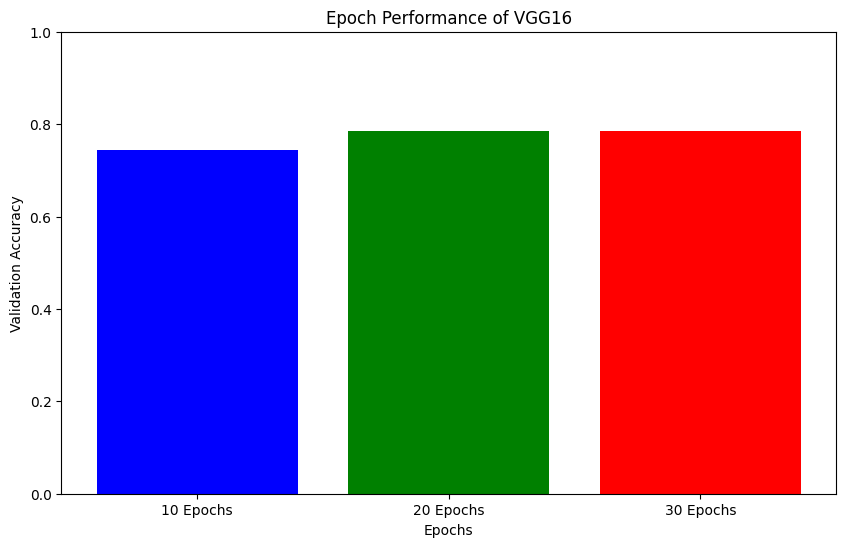

In [23]:
# Code to compare the cnn epoch performance of 10, 20, 30
accuracy_scores = [
    VGG16_history1.history['val_accuracy'][-1],  # Accuracy after 10 epochs
    VGG16_history2.history['val_accuracy'][-1], # Accuracy after 20 epochs
    VGG16_history2.history['val_accuracy'][-1]  # Accuracy after 30 epochs
]

algorithms = ['10 Epochs', '20 Epochs', '30 Epochs']

plt.figure(figsize=(10, 6))
plt.bar(algorithms, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.title('Epoch Performance of VGG16')
plt.ylim([0, 1])
plt.show()

### MobileNet V2 on 10 epochs

In [14]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained MobileNetV2 model without the top layer for transfer learning
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150,150, 3))

# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of MobileNetV2
model3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
model3.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define a checkpoint to save the best model during training
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Train the model
history3 = model3.fit(train_generator, epochs=10, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

<ipython-input-14-ff75350885ec>:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150,150, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 810ms/step - accuracy: 0.4442 - loss: 1.6707
Epoch 1: val_loss improved from inf to 0.69693, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 327s 942ms/step - accuracy: 0.4446 - loss: 1.6696 - val_accuracy: 0.7513 - val_loss: 0.6969
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 784ms/step - accuracy: 0.6608 - loss: 0.9469
Epoch 2: val_loss improved from 0.69693 to 0.60688, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 288s 863ms/step - accuracy: 0.6609 - loss: 0.9468 - val_accuracy: 0.7678 - val_loss: 0.6069
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 794ms/step - accuracy: 0.6917 - loss: 0.8398
Epoch 3: val_loss improved from 0.60688 to 0.56870, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 292s 874ms/step - accuracy: 0.6917 - loss: 0.8398 - val_accuracy: 0.7881 - val_loss: 0.5687
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 784ms/step - accuracy: 0.6966 - loss: 0.8255
Epoch 4: val_loss improved from 0.56870 to 0.55075, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 318s 863ms/step - accuracy: 0.6966 - loss: 0.8255 - val_accuracy: 0.7806 - val_loss: 0.5507
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 785ms/step - accuracy: 0.7153 - loss: 0.7734
Epoch 5: val_loss did not improve from 0.55075
333/333 ━━━━━━━━━━━━━━━━━━━━ 288s 863ms/step - accuracy: 0.7153 - loss: 0.7734 - val_accuracy: 0.7806 - val_loss: 0.5574
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 781ms/step - accuracy: 0.7243 - loss: 0.7561
Epoch 6: val_loss improved from 0.55075 to 0.50590, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 302s 905ms/step - accuracy: 0.7243 - loss: 0.7561 - val_accuracy: 0.8032 - val_loss: 0.5059
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 770ms/step - accuracy: 0.7344 - loss: 0.7339
Epoch 7: val_loss did not improve from 0.50590
333/333 ━━━━━━━━━━━━━━━━━━━━ 283s 849ms/step - accuracy: 0.7344 - loss: 0.7339 - val_accuracy: 0.7964 - val_loss: 0.5170
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 773ms/step - accuracy: 0.7319 - loss: 0.6915
Epoch 8: val_loss improved from 0.50590 to 0.49654, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 299s 897ms/step - accuracy: 0.7319 - loss: 0.6916 - val_accuracy: 0.8107 - val_loss: 0.4965
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 789ms/step - accuracy: 0.7388 - loss: 0.7108
Epoch 9: val_loss did not improve from 0.49654
333/333 ━━━━━━━━━━━━━━━━━━━━ 289s 868ms/step - accuracy: 0.7388 - loss: 0.7108 - val_accuracy: 0.8039 - val_loss: 0.5084
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 788ms/step - accuracy: 0.7413 - loss: 0.6977
Epoch 10: val_loss did not improve from 0.49654
333/333 ━━━━━━━━━━━━━━━━━━━━ 321s 866ms/step - accuracy: 0.7413 - loss: 0.6977 - val_accuracy: 0.7941 - val_loss: 0.5124
42/42 ━━━━━━━━━━━━━━━━━━━━ 27s 632ms/step - accuracy: 0.7731 - loss: 0.5958
Test accuracy: 0.7778


### Validation Accuracy and Loss for 10 epochs

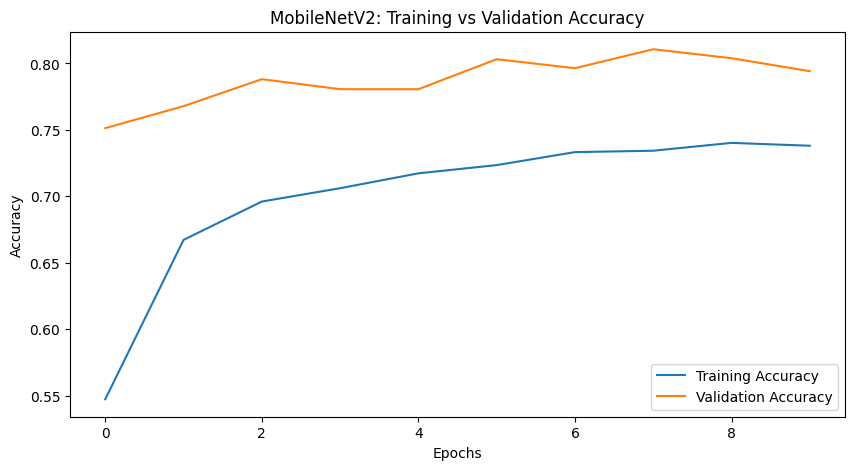

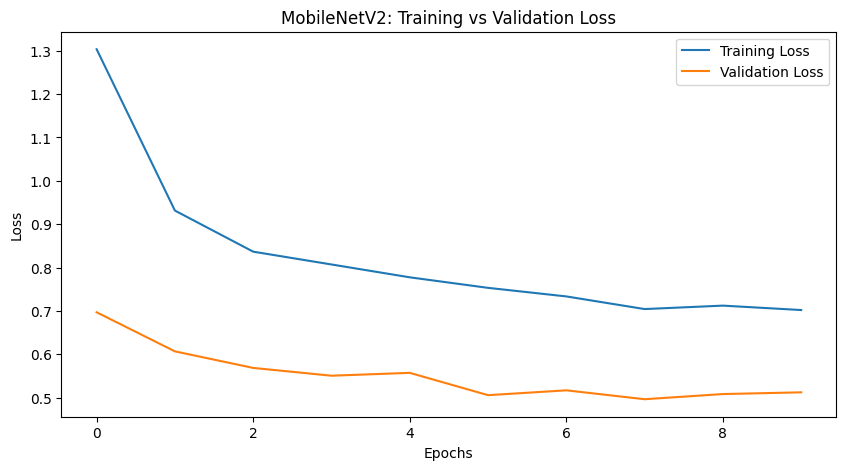

In [15]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history3.history['accuracy'], label='Training Accuracy')
plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history3.history['loss'], label='Training Loss')
plt.plot(history3.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model Evaluation on 10 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

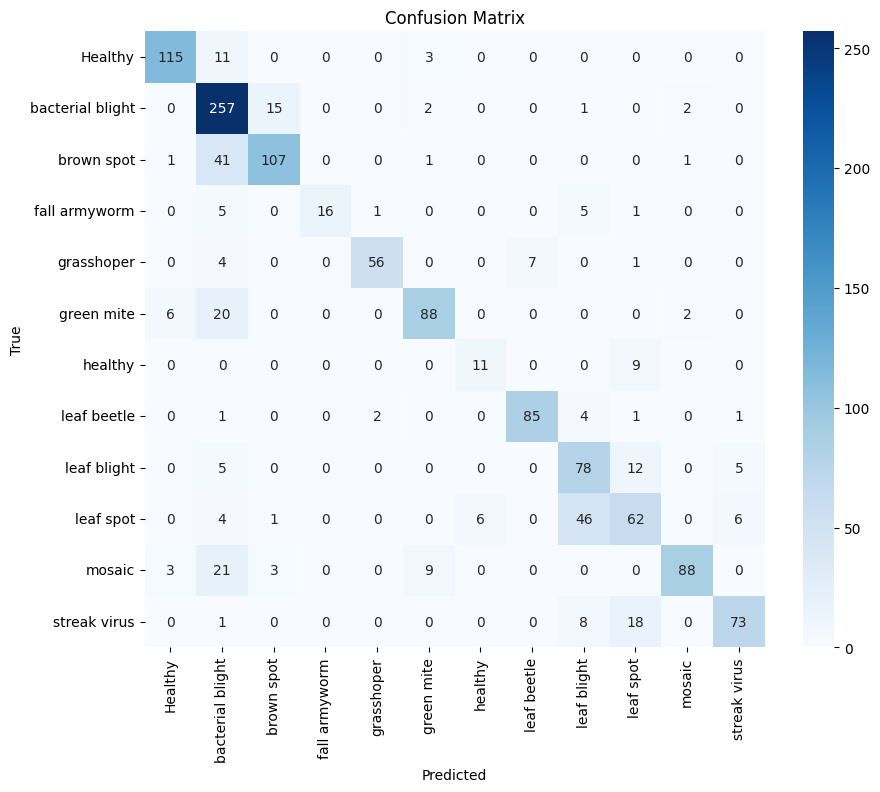

In [16]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model3.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### MobileNet V2 on 20 epochs

In [17]:
# Train the model
history4 = model3.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 801ms/step - accuracy: 0.7468 - loss: 0.6917
Epoch 1: val_loss did not improve from 0.49654
333/333 ━━━━━━━━━━━━━━━━━━━━ 297s 890ms/step - accuracy: 0.7468 - loss: 0.6917 - val_accuracy: 0.7971 - val_loss: 0.4976
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 796ms/step - accuracy: 0.7466 - loss: 0.6816
Epoch 2: val_loss improved from 0.49654 to 0.49033, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 292s 876ms/step - accuracy: 0.7466 - loss: 0.6816 - val_accuracy: 0.8054 - val_loss: 0.4903
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 776ms/step - accuracy: 0.7601 - loss: 0.6633
Epoch 3: val_loss improved from 0.49033 to 0.46740, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 285s 855ms/step - accuracy: 0.7601 - loss: 0.6633 - val_accuracy: 0.8144 - val_loss: 0.4674
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 753ms/step - accuracy: 0.7480 - loss: 0.6761
Epoch 4: val_loss did not improve from 0.46740
333/333 ━━━━━━━━━━━━━━━━━━━━ 292s 876ms/step - accuracy: 0.7480 - loss: 0.6761 - val_accuracy: 0.8159 - val_loss: 0.4779
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 772ms/step - accuracy: 0.7567 - loss: 0.6587
Epoch 5: val_loss did not improve from 0.46740
333/333 ━━━━━━━━━━━━━━━━━━━━ 284s 851ms/step - accuracy: 0.7567 - loss: 0.6587 - val_accuracy: 0.8107 - val_loss: 0.4966
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 779ms/step - accuracy: 0.7568 - loss: 0.6601
Epoch 6: val_loss improved from 0.46740 to 0.46423, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 286s 858ms/step - accuracy: 0.7567 - loss: 0.6601 - val_accuracy: 0.8137 - val_loss: 0.4642
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 769ms/step - accuracy: 0.7643 - loss: 0.6427
Epoch 7: val_loss did not improve from 0.46423
333/333 ━━━━━━━━━━━━━━━━━━━━ 318s 847ms/step - accuracy: 0.7643 - loss: 0.6427 - val_accuracy: 0.8167 - val_loss: 0.4685
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 751ms/step - accuracy: 0.7626 - loss: 0.6587
Epoch 8: val_loss did not improve from 0.46423
333/333 ━━━━━━━━━━━━━━━━━━━━ 276s 828ms/step - accuracy: 0.7626 - loss: 0.6587 - val_accuracy: 0.8129 - val_loss: 0.4734
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 759ms/step - accuracy: 0.7666 - loss: 0.6276
Epoch 9: val_loss improved from 0.46423 to 0.45434, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 838ms/step - accuracy: 0.7666 - loss: 0.6276 - val_accuracy: 0.8234 - val_loss: 0.4543
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 760ms/step - accuracy: 0.7655 - loss: 0.6357
Epoch 10: val_loss did not improve from 0.45434
333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 838ms/step - accuracy: 0.7655 - loss: 0.6357 - val_accuracy: 0.8077 - val_loss: 0.4889
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 762ms/step - accuracy: 0.7640 - loss: 0.6272
Epoch 11: val_loss improved from 0.45434 to 0.45378, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 280s 841ms/step - accuracy: 0.7640 - loss: 0.6272 - val_accuracy: 0.8279 - val_loss: 0.4538
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 751ms/step - accuracy: 0.7628 - loss: 0.6334
Epoch 12: val_loss did not improve from 0.45378
333/333 ━━━━━━━━━━━━━━━━━━━━ 276s 829ms/step - accuracy: 0.7629 - loss: 0.6333 - val_accuracy: 0.8054 - val_loss: 0.4769
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 761ms/step - accuracy: 0.7689 - loss: 0.6241
Epoch 13: val_loss improved from 0.45378 to 0.44598, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 326s 840ms/step - accuracy: 0.7689 - loss: 0.6241 - val_accuracy: 0.8249 - val_loss: 0.4460
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 801ms/step - accuracy: 0.7650 - loss: 0.6209
Epoch 14: val_loss did not improve from 0.44598
333/333 ━━━━━━━━━━━━━━━━━━━━ 293s 878ms/step - accuracy: 0.7650 - loss: 0.6209 - val_accuracy: 0.8264 - val_loss: 0.4598
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 767ms/step - accuracy: 0.7631 - loss: 0.6229
Epoch 15: val_loss did not improve from 0.44598
333/333 ━━━━━━━━━━━━━━━━━━━━ 282s 845ms/step - accuracy: 0.7631 - loss: 0.6230 - val_accuracy: 0.8182 - val_loss: 0.4561
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 755ms/step - accuracy: 0.7714 - loss: 0.5974
Epoch 16: val_loss did not improve from 0.44598
333/333 ━━━━━━━━━━━━━━━━━━━━ 277s 832ms/step - accuracy: 0.7714 - loss: 0.5974 - val_accuracy: 0.8077 - val_loss: 0.4794
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 762ms/step - accuracy: 0.7685 - loss: 0.6003
Epoch 17: val_lo

333/333 ━━━━━━━━━━━━━━━━━━━━ 278s 835ms/step - accuracy: 0.7726 - loss: 0.5945 - val_accuracy: 0.8182 - val_loss: 0.4444
42/42 ━━━━━━━━━━━━━━━━━━━━ 25s 591ms/step - accuracy: 0.8236 - loss: 0.4603
Test accuracy: 0.8048


### Model Evaluation on 20 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

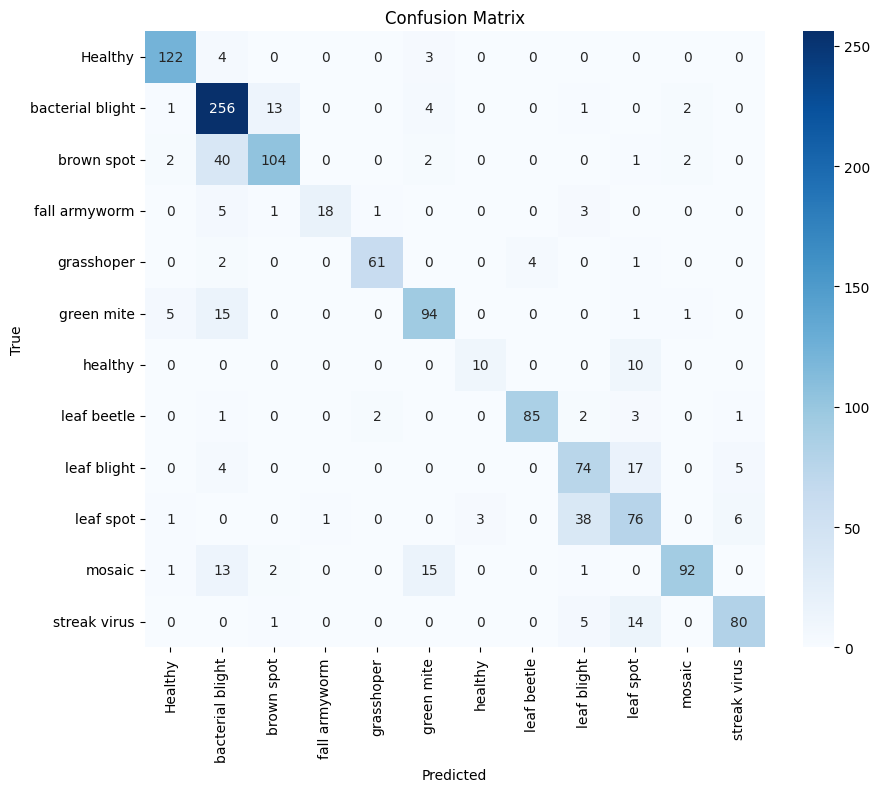

In [18]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model3.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### MobileNet V2 on 30 epochs

In [19]:
# Train the model
history5 = model3.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 760ms/step - accuracy: 0.7821 - loss: 0.5950
Epoch 1: val_loss did not improve from 0.44439
333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 835ms/step - accuracy: 0.7821 - loss: 0.5950 - val_accuracy: 0.8182 - val_loss: 0.4792
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 761ms/step - accuracy: 0.7712 - loss: 0.5931
Epoch 2: val_loss did not improve from 0.44439
333/333 ━━━━━━━━━━━━━━━━━━━━ 295s 885ms/step - accuracy: 0.7712 - loss: 0.5931 - val_accuracy: 0.8189 - val_loss: 0.4701
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 761ms/step - accuracy: 0.7852 - loss: 0.5815
Epoch 3: val_loss improved from 0.44439 to 0.44254, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 839ms/step - accuracy: 0.7852 - loss: 0.5815 - val_accuracy: 0.8272 - val_loss: 0.4425
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 762ms/step - accuracy: 0.7836 - loss: 0.5730
Epoch 4: val_loss did not improve from 0.44254
333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 838ms/step - accuracy: 0.7836 - loss: 0.5730 - val_accuracy: 0.8099 - val_loss: 0.5000
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 748ms/step - accuracy: 0.7746 - loss: 0.5838
Epoch 5: val_loss did not improve from 0.44254
333/333 ━━━━━━━━━━━━━━━━━━━━ 290s 871ms/step - accuracy: 0.7747 - loss: 0.5838 - val_accuracy: 0.8092 - val_loss: 0.4771
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 804ms/step - accuracy: 0.7767 - loss: 0.5944
Epoch 6: val_loss did not improve from 0.44254
333/333 ━━━━━━━━━━━━━━━━━━━━ 309s 928ms/step - accuracy: 0.7768 - loss: 0.5944 - val_accuracy: 0.8257 - val_loss: 0.4451
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 756ms/step - accuracy: 0.7783 - loss: 0.5756
Epoch 7: val_loss did n

333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 837ms/step - accuracy: 0.7840 - loss: 0.5842 - val_accuracy: 0.8362 - val_loss: 0.4258
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 752ms/step - accuracy: 0.7858 - loss: 0.5535
Epoch 9: val_loss did not improve from 0.42579
333/333 ━━━━━━━━━━━━━━━━━━━━ 292s 876ms/step - accuracy: 0.7857 - loss: 0.5535 - val_accuracy: 0.8092 - val_loss: 0.4722
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 759ms/step - accuracy: 0.7749 - loss: 0.5877
Epoch 10: val_loss did not improve from 0.42579
333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 838ms/step - accuracy: 0.7749 - loss: 0.5877 - val_accuracy: 0.8257 - val_loss: 0.4517
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 765ms/step - accuracy: 0.7753 - loss: 0.5987
Epoch 11: val_loss did not improve from 0.42579
333/333 ━━━━━━━━━━━━━━━━━━━━ 279s 839ms/step - accuracy: 0.7753 - loss: 0.5986 - val_accuracy: 0.8332 - val_loss: 0.4397
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 767ms/step - accuracy: 0.7856 - loss: 0.5769
Epoch 12: val_loss

333/333 ━━━━━━━━━━━━━━━━━━━━ 284s 851ms/step - accuracy: 0.7861 - loss: 0.5518 - val_accuracy: 0.8347 - val_loss: 0.4244
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 739ms/step - accuracy: 0.7917 - loss: 0.5577
Epoch 20: val_loss did not improve from 0.42436
333/333 ━━━━━━━━━━━━━━━━━━━━ 310s 813ms/step - accuracy: 0.7917 - loss: 0.5578 - val_accuracy: 0.8182 - val_loss: 0.4649
42/42 ━━━━━━━━━━━━━━━━━━━━ 25s 589ms/step - accuracy: 0.8122 - loss: 0.5240
Test accuracy: 0.8108


### Validation Accuracy and Loss for 30 epochs

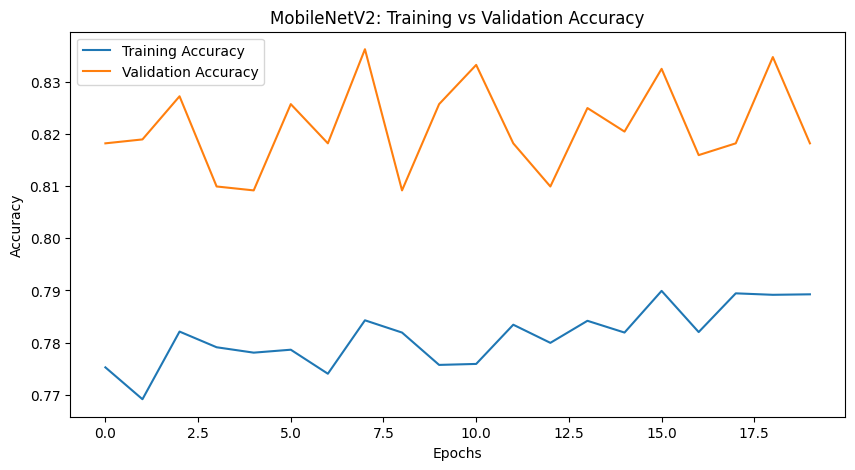

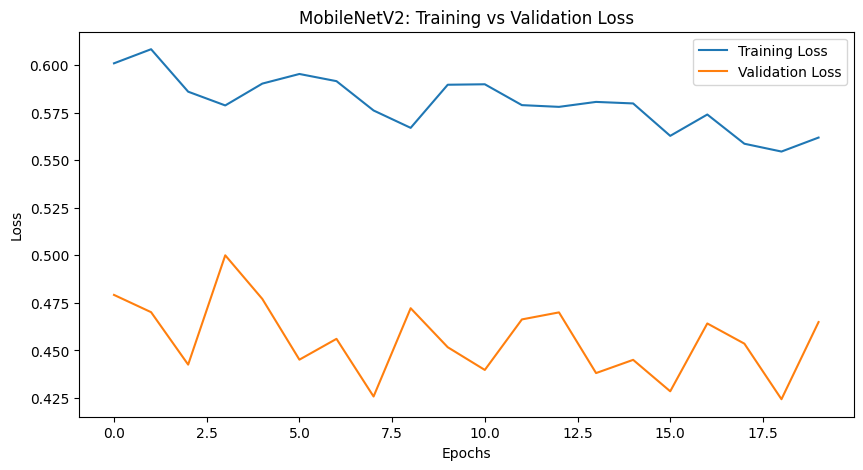

In [20]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history5.history['accuracy'], label='Training Accuracy')
plt.plot(history5.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history5.history['loss'], label='Training Loss')
plt.plot(history5.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model evaluation on 30 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 754ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 788ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

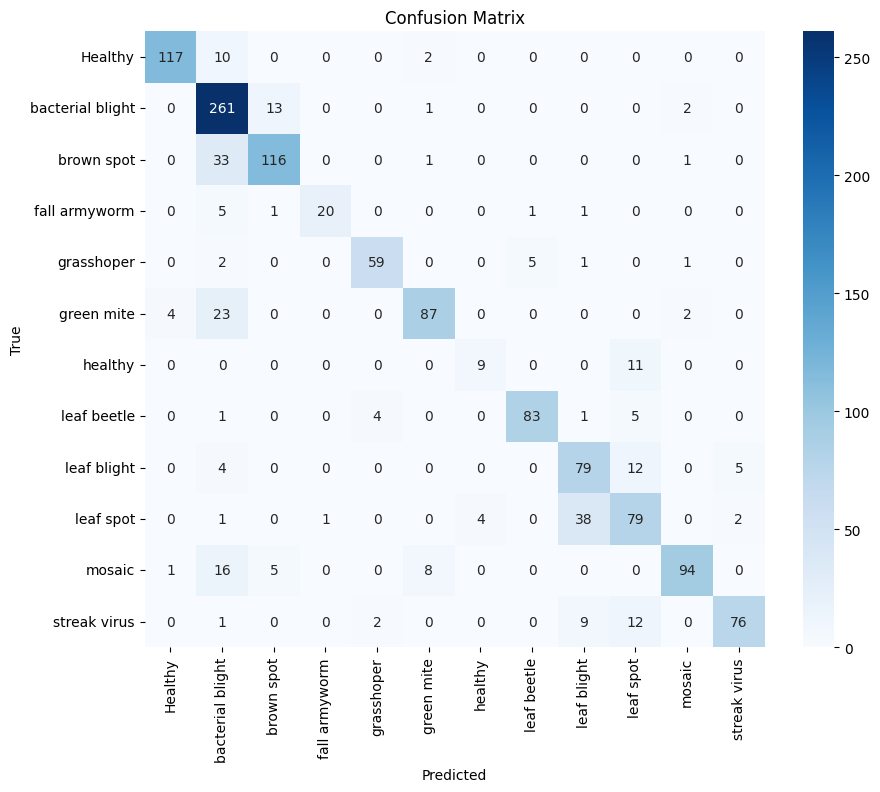

In [21]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model3.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

#### Algorithm comparison of 10 , 20 and 30 epochs of MobileNet V2

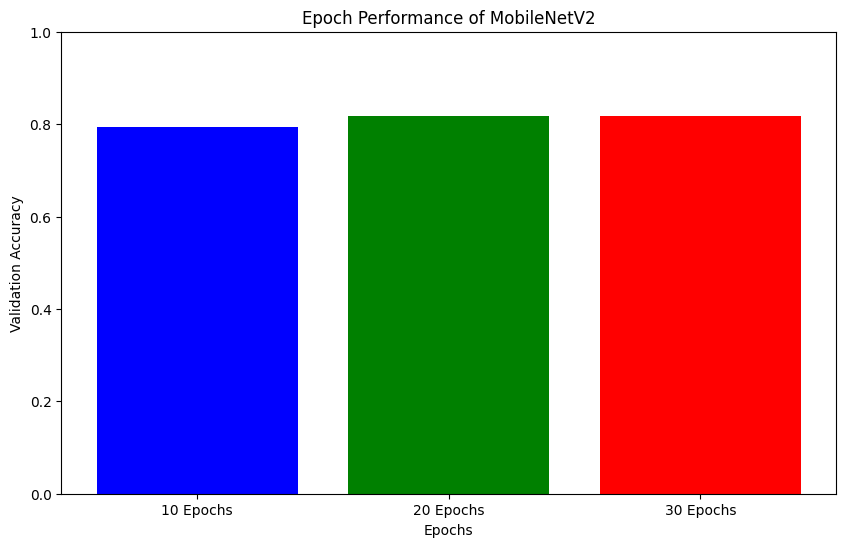

In [22]:
# Code to compare the mobilenet v2 epoch performance of 10, 20, 30
accuracy_scores = [
    history3.history['val_accuracy'][-1],  # Accuracy after 10 epochs
    history4.history['val_accuracy'][-1], # Accuracy after 20 epochs
    history5.history['val_accuracy'][-1]  # Accuracy after 30 epochs
]

algorithms = ['10 Epochs', '20 Epochs', '30 Epochs']

plt.figure(figsize=(10, 6))
plt.bar(algorithms, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Epochs')  # Change x-axis label to "Epochs"
plt.ylabel('Validation Accuracy')
plt.title('Epoch Performance of MobileNetV2')
plt.ylim([0, 1])  # Set y-axis limits
plt.show()

### Proposed Hybrid Model

In [14]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50, EfficientNetB3, MobileNetV2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Image size (Ensure consistency across models)
IMG_SIZE = (150, 150, 3)
BATCH_SIZE = 32

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.3,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load dataset
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

# Get number of classes
num_classes = len(train_generator.class_indices)

# Define a single input tensor that will be shared across models
input_tensor = Input(shape=IMG_SIZE)

# Load pre-trained models without top layers
resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
effnet = EfficientNetB3(weights='imagenet', include_top=False, input_tensor=input_tensor)
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze initial layers
for layer in resnet.layers[:140]: layer.trainable = False
for layer in effnet.layers[:180]: layer.trainable = False
for layer in mobilenet.layers[:130]: layer.trainable = False

# Feature extraction
resnet_out = GlobalAveragePooling2D()(resnet.output)
effnet_out = GlobalAveragePooling2D()(effnet.output)
mobilenet_out = GlobalAveragePooling2D()(mobilenet.output)

# Concatenate features from all models
merged = Concatenate()([resnet_out, effnet_out, mobilenet_out])
merged = BatchNormalization()(merged)  # Normalize features for stability

# Fully connected layers
x = Dense(512, activation='relu')(merged)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)  # Corrected num_classes

# Define model with a single shared input
model = Model(inputs=input_tensor, outputs=output)

# Compile model
model.compile(optimizer=AdamW(learning_rate=3e-4, weight_decay=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)
]

# Train model
history = model.fit(train_generator, validation_data=valid_generator,
                    epochs=10, batch_size=BATCH_SIZE, callbacks=callbacks)

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


<ipython-input-14-d947e404c790>:43: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 3602s 11s/step - accuracy: 0.4454 - loss: 1.8795 - val_accuracy: 0.6514 - val_loss: 1.9145 - learning_rate: 3.0000e-04
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 3495s 10s/step - accuracy: 0.7057 - loss: 0.8784 - val_accuracy: 0.6875 - val_loss: 1.8534 - learning_rate: 3.0000e-04
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 3526s 11s/step - accuracy: 0.7531 - loss: 0.7350 - val_accuracy: 0.6867 - val_loss: 1.5713 - learning_rate: 3.0000e-04
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 3487s 10s/step - accuracy: 0.7701 - loss: 0.6481 - val_accuracy: 0.7739 - val_loss: 0.8205 - learning_rate: 3.0000e-04
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 3535s 11s/step - accuracy: 0.7922 - loss: 0.6027 - val_accuracy: 0.8069 - val_loss: 0.6753 - learning_rate: 3.0000e-04
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 3545s 11s/step - accuracy: 0.7966 - loss: 0.5573 - val_accuracy: 0.7708 - val_loss: 0.8241 - learning_rate: 3.0000e-04
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 3485s 

### Test Accuracy on 10 epochs

In [15]:
# Evaluate on test data
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")

42/42 ━━━━━━━━━━━━━━━━━━━━ 205s 5s/step - accuracy: 0.8395 - loss: 0.4459
Test Accuracy: 0.8303


### Validation Accuracy and loss for 10 epochs

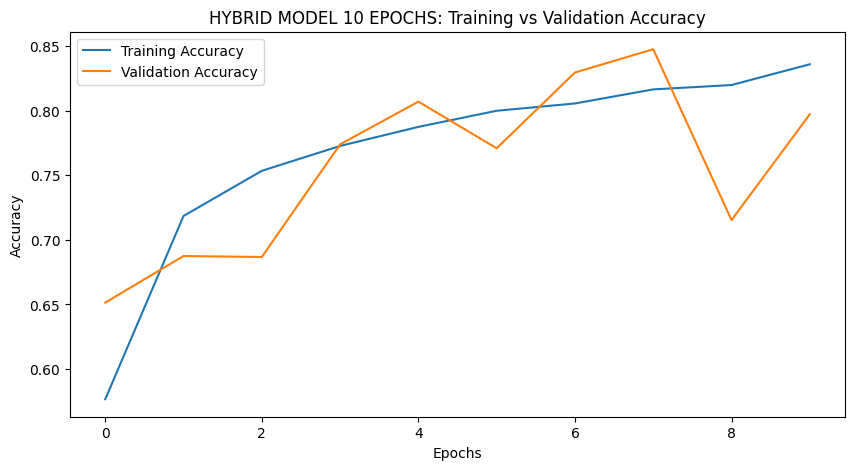

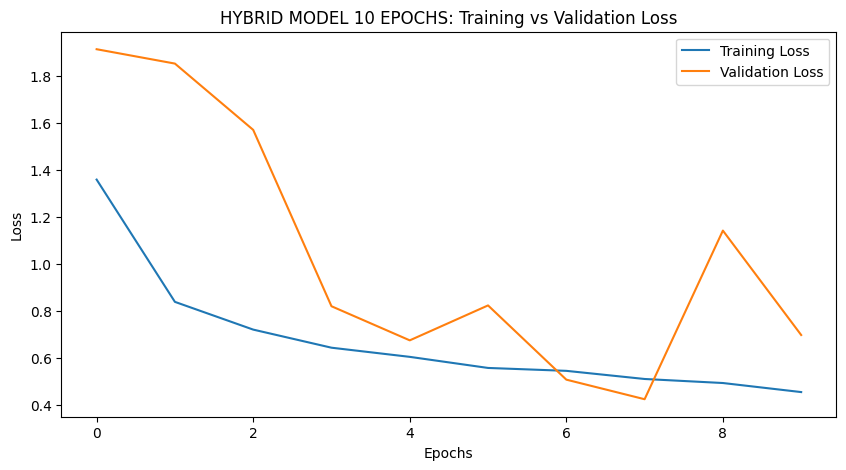

In [17]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('HYBRID MODEL 10 EPOCHS: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('HYBRID MODEL 10 EPOCHS: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Hybrid Model 20 epochs

In [14]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50, EfficientNetB3, MobileNetV2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Image size (Ensure consistency across models)
IMG_SIZE = (150, 150, 3)
BATCH_SIZE = 32

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.3,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load dataset
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

# Get number of classes
num_classes = len(train_generator.class_indices)

# Define a single input tensor that will be shared across models
input_tensor = Input(shape=IMG_SIZE)

# Load pre-trained models without top layers
resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
effnet = EfficientNetB3(weights='imagenet', include_top=False, input_tensor=input_tensor)
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze initial layers
for layer in resnet.layers[:140]: layer.trainable = False
for layer in effnet.layers[:180]: layer.trainable = False
for layer in mobilenet.layers[:130]: layer.trainable = False

# Feature extraction
resnet_out = GlobalAveragePooling2D()(resnet.output)
effnet_out = GlobalAveragePooling2D()(effnet.output)
mobilenet_out = GlobalAveragePooling2D()(mobilenet.output)

# Concatenate features from all models
merged = Concatenate()([resnet_out, effnet_out, mobilenet_out])
merged = BatchNormalization()(merged)  # Normalize features for stability

# Fully connected layers
x = Dense(512, activation='relu')(merged)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)  # Corrected num_classes

# Define model with a single shared input
model = Model(inputs=input_tensor, outputs=output)

# Compile model
model.compile(optimizer=AdamW(learning_rate=3e-4, weight_decay=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)
]

# Train model
history = model.fit(train_generator, validation_data=valid_generator,
                    epochs=20, batch_size=BATCH_SIZE, callbacks=callbacks)

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


<ipython-input-14-8c1c70e59bf6>:43: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 357s 688ms/step - accuracy: 0.4603 - loss: 1.8094 - val_accuracy: 0.6829 - val_loss: 1.5809 - learning_rate: 3.0000e-04
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 129s 388ms/step - accuracy: 0.7006 - loss: 0.9041 - val_accuracy: 0.7400 - val_loss: 0.9790 - learning_rate: 3.0000e-04
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 131s 392ms/step - accuracy: 0.7524 - loss: 0.7224 - val_accuracy: 0.7618 - val_loss: 0.9372 - learning_rate: 3.0000e-04
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 127s 380ms/step - accuracy: 0.7768 - loss: 0.6526 - val_accuracy: 0.7964 - val_loss: 0.7568 - learning_rate: 3.0000e-04
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 127s 382ms/step - accuracy: 0.7894 - loss: 0.6047 - val_accuracy: 0.6860 - val_loss: 1.6195 - learning_rate: 3.0000e-04
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 128s 384ms/step - accuracy: 0.8005 - loss: 0.5656 - val_accuracy: 0.6649 - val_loss: 1.7318 - learning_rate: 3.0000e-04
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 

### Test Accuracy on 20 epochs

In [15]:
# Evaluate on test data
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")


42/42 ━━━━━━━━━━━━━━━━━━━━ 20s 478ms/step - accuracy: 0.8819 - loss: 0.2840
Test Accuracy: 0.8806


### VALIDATION ACCURACY AND LOSS FOR 20 EPOCHS

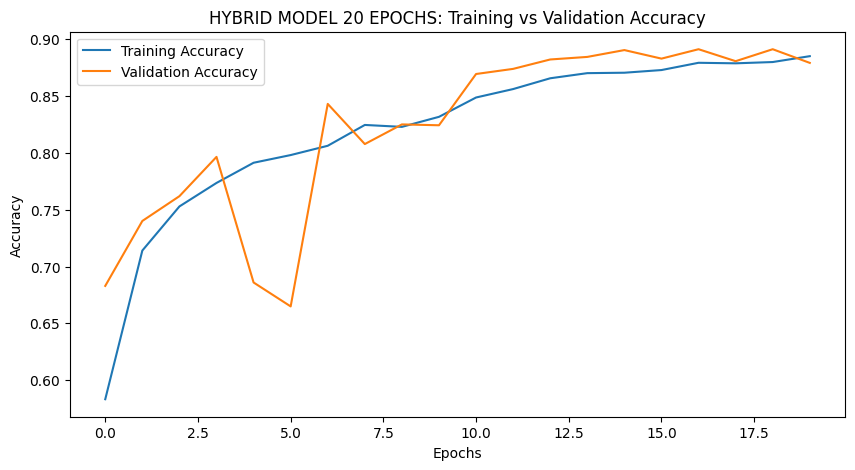

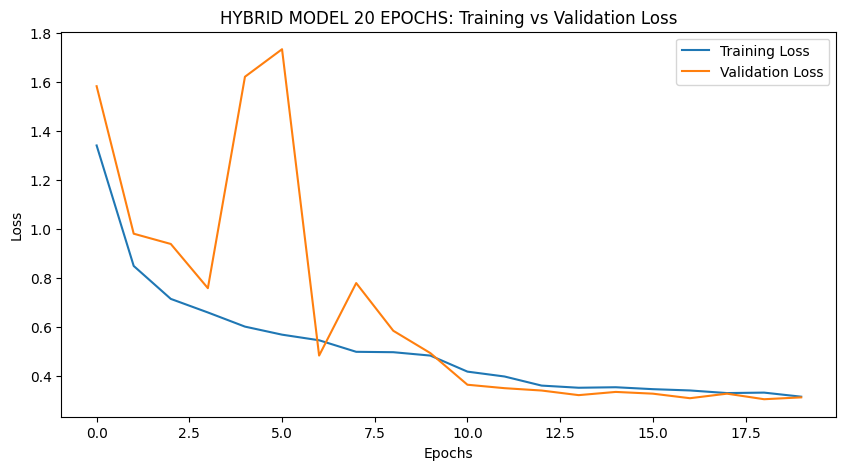

In [16]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('HYBRID MODEL 20 EPOCHS: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('HYBRID MODEL 20 EPOCHS: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Hybrid Model 30 Epochs

In [14]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50, EfficientNetB3, MobileNetV2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Image size (Ensure consistency across models)
IMG_SIZE = (150, 150, 3)
BATCH_SIZE = 32

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.3,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load dataset
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

# Get number of classes
num_classes = len(train_generator.class_indices)

# Define a single input tensor that will be shared across models
input_tensor = Input(shape=IMG_SIZE)

# Load pre-trained models without top layers
resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
effnet = EfficientNetB3(weights='imagenet', include_top=False, input_tensor=input_tensor)
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze initial layers
for layer in resnet.layers[:140]: layer.trainable = False
for layer in effnet.layers[:180]: layer.trainable = False
for layer in mobilenet.layers[:130]: layer.trainable = False

# Feature extraction
resnet_out = GlobalAveragePooling2D()(resnet.output)
effnet_out = GlobalAveragePooling2D()(effnet.output)
mobilenet_out = GlobalAveragePooling2D()(mobilenet.output)

# Concatenate features from all models
merged = Concatenate()([resnet_out, effnet_out, mobilenet_out])
merged = BatchNormalization()(merged)  # Normalize features for stability

# Fully connected layers
x = Dense(512, activation='relu')(merged)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)  # Corrected num_classes

# Define model with a single shared input
model = Model(inputs=input_tensor, outputs=output)

# Compile model
model.compile(optimizer=AdamW(learning_rate=3e-4, weight_decay=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)
]

# Train model
history = model.fit(train_generator, validation_data=valid_generator,
                    epochs=30, batch_size=BATCH_SIZE, callbacks=callbacks)

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


<ipython-input-14-9c759e649559>:43: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 681s 2s/step - accuracy: 0.4530 - loss: 1.7762 - val_accuracy: 0.6694 - val_loss: 1.6570 - learning_rate: 3.0000e-04
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 614s 2s/step - accuracy: 0.7124 - loss: 0.8613 - val_accuracy: 0.7393 - val_loss: 1.2591 - learning_rate: 3.0000e-04
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 614s 2s/step - accuracy: 0.7466 - loss: 0.7238 - val_accuracy: 0.7446 - val_loss: 0.6999 - learning_rate: 3.0000e-04
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 617s 2s/step - accuracy: 0.7795 - loss: 0.6037 - val_accuracy: 0.7829 - val_loss: 0.8022 - learning_rate: 3.0000e-04
Epoch 5/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 620s 2s/step - accuracy: 0.7930 - loss: 0.5883 - val_accuracy: 0.8039 - val_loss: 0.6664 - learning_rate: 3.0000e-04
Epoch 6/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 618s 2s/step - accuracy: 0.7999 - loss: 0.5589 - val_accuracy: 0.7889 - val_loss: 0.7803 - learning_rate: 3.0000e-04
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 623s 2s/step - acc

### Test Accuracy on 30 Epochs

In [15]:
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")

42/42 ━━━━━━━━━━━━━━━━━━━━ 35s 818ms/step - accuracy: 0.8934 - loss: 0.2695
Test Accuracy: 0.8806


### VALIDATION ACCURACY AND LOSS FOR 30 EPOCHS

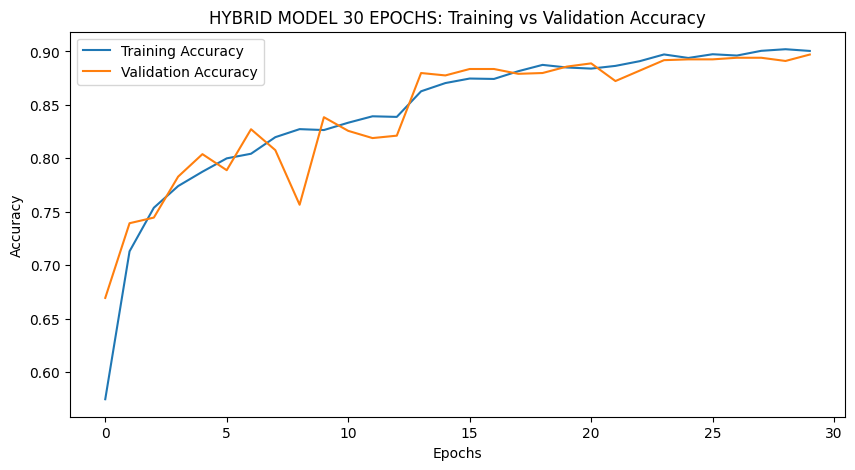

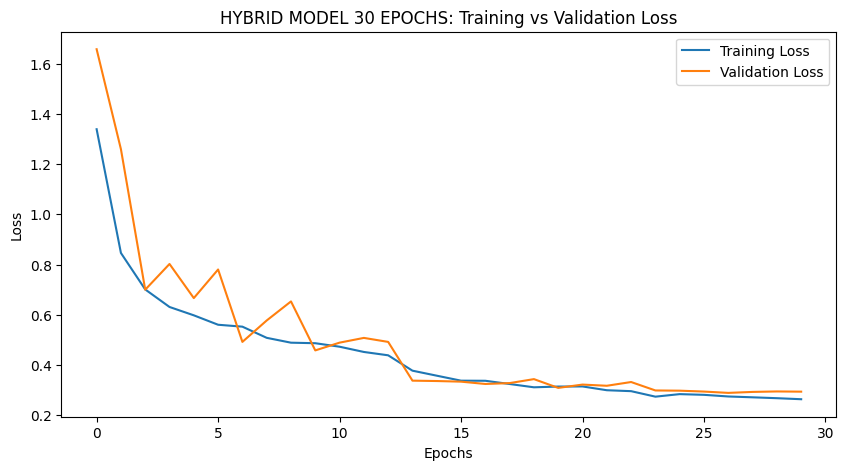

In [16]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('HYBRID MODEL 30 EPOCHS: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('HYBRID MODEL 30 EPOCHS: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Hybrid Model Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 833ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 827ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 827ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 815ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 810ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

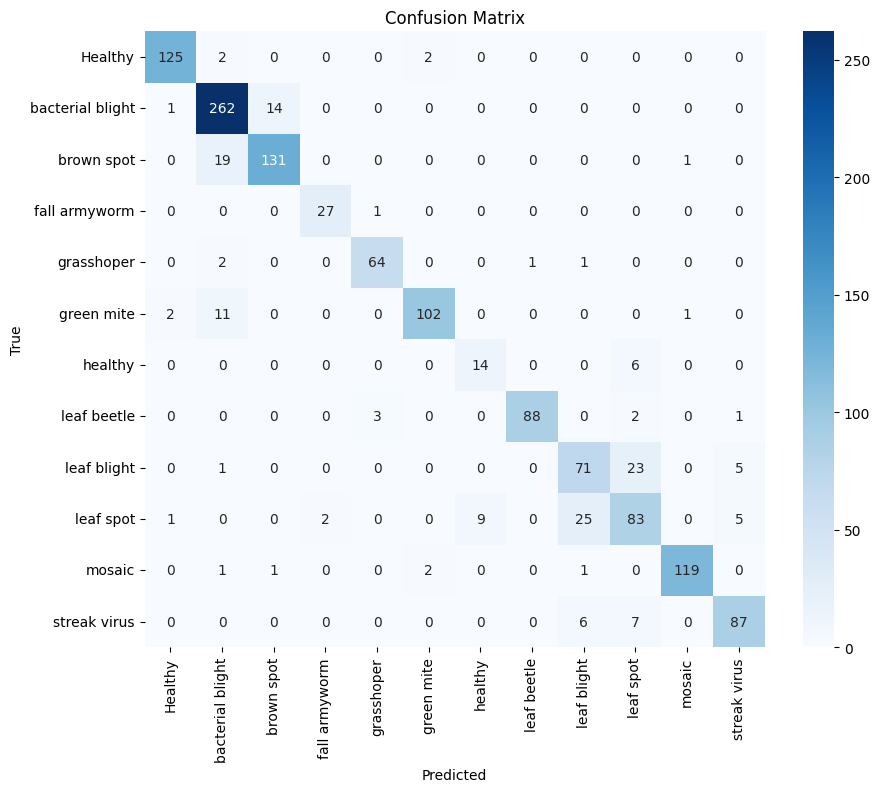

In [19]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### Hybrid Model User Input

Enter a label (fall armyworm, grasshoper, healthy, leaf beetle, leaf blight, leaf spot, streak virus, bacterial blight, brown spot, green mite, Healthy, mosaic) or "*" to quit: brown spot
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


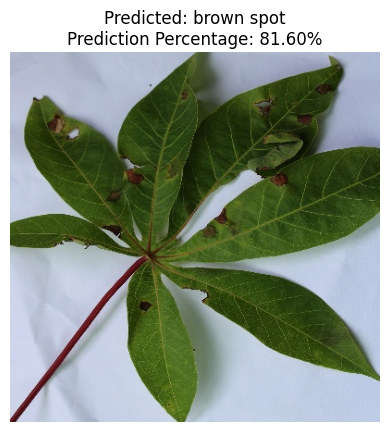

Actual label: brown spot
Predicted label: brown spot
Prediction percentage: 81.60%


In [ ]:
import os
import cv2 as cv
import random
import numpy as np
import matplotlib.pyplot as plt

# Define base directories for both datasets
maize_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
cassava_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'

# Folder names for Maize dataset
maize_folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Folder names for Cassava dataset
cassava_folders = ['bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# Combine Maize and Cassava folder names into a single labels list
labels = maize_folders + cassava_folders

# Define the image size for model input
image_size = (224, 224)

# Function to allow user input and display images and accuracy
def user_input_and_accuracy(labels, model):
    correct_predictions = 0
    total_predictions = 0

    while True:
        # Get user input
        user_input = input(f'Enter a label ({", ".join(labels)}) or "*" to quit: ').strip().lower()
        if user_input == '*':
            break
        if user_input not in labels:
            print("Invalid input. Please enter a valid label.")
            continue

        # Select the base directory and label folder based on user input
        if user_input in maize_folders:
            base_dir = maize_base_dir
        elif user_input in cassava_folders:
            base_dir = cassava_base_dir
        else:
            print("Invalid label input.")
            continue

        # Select a random image with the user input label
        label_folder = os.path.join(base_dir, user_input)
        img_name = random.choice(os.listdir(label_folder))
        img_path = os.path.join(label_folder, img_name)
        img = cv.imread(img_path)
        img_resized = cv.resize(img, image_size)
        img_resized = np.expand_dims(img_resized, axis=0) / 255.0  # Rescale

        # Predict the image using the trained model
        prediction = model.predict(img_resized)
        predicted_label = labels[np.argmax(prediction)]
        prediction_percentage = prediction[0][np.argmax(prediction)] * 100

        # Display the image
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f'Predicted: {user_input}\nPrediction Percentage: {prediction_percentage:.2f}%')
        plt.show()

        # Determine if the user's input is correct
        correct = user_input == predicted_label
        total_predictions += 1
        if correct:
            correct_predictions += 1

        # Calculate and display accuracy
        accuracy = (correct_predictions / total_predictions) * 100
        print(f"Actual label: {user_input}")
        print(f"Predicted label: {user_input}")
        print(f"Prediction percentage: {prediction_percentage:.2f}%")

        input("Press Enter to continue...")

        # Check if accuracy is below 80%
        if accuracy < 80:
            print("Accuracy is below 80%. Please try again.")
            break  # Exit loop if accuracy falls below 80%

# Assuming the model is already loaded and available, call the function
user_input_and_accuracy(labels, model)